In [1]:
import pandas as pd
import ast
from ast import literal_eval
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import statistics
import networkx as nx
from collections import Counter, defaultdict
import matplotlib.cm as cm
from networkx.algorithms.community import louvain_communities
from networkx.algorithms.community import modularity
import pandas as pd
from requests.adapters import HTTPAdapter
from requests.packages.urllib3.util.retry import Retry
import os
from itertools import combinations
from networkx.algorithms.community import louvain_communities, girvan_newman, k_clique_communities




# Import Data

In [105]:
gender_scores = ['first_author_score', 'team_score', 'last_author_score']
gender_dicts = ['gender_counts', 'FA_genders', 'LA_genders']
visualization_dir = 'C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/Visualizations/'
gender_labels = ['male', 'female', 'unknown', 'mostly_male', 'mostly_female']

# Color mapping for genders
colors = {
    -1: '#3B4CC0',  # Male
    -0.5: '#89ACFD',  # Mostly male
    0: '#E1DAE6',  # Neutral
    0.5: '#F39577',  # Mostly female
    1: '#B40426'   # Female
}


colors_label = {
        'male': '#3B4CC0',
        'mostly_male': '#89ACFD',
        'unknown': '#E1DAE6', 
        'mostly_female':'#F39577',
        'female': '#B40426'
    }



In [2]:
data_df = pd.read_csv('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/graph_papers_full.csv', encoding='utf-8')
data_df

,title_s,journalTitle_s,authLastName_s,authFullName_s,abstract_s,fileMain_s,ePublicationDateY_i,Complete,Genders,unknownGenders,...,Parsed_BERTopics,Gender_Counts,Gender_Numeric_Avg,First_Gender,First_Gender_Value,Last_Gender,Last_Gender_Value,TaxoEntities_Count,Num_Unique_Entities,Entity_Buckets
0,"[""Exploring farmers' agrobiodiversity manageme...",People and Nature,"['Mariel', 'Carrière', 'Penot', 'Danthu', 'Raf...","['Juliette Mariel', 'Stéphanie M. Carrière', '...","[""1. Interactions between farmers and agrobiod...",https://hal.inrae.fr/hal-03461601/document,NaN,True,"['female', 'female', 'male', 'male', 'unknown'...",33.333333,...,"{'B0': 1, 'B124': 7, 'B-1': 4}","{'female': 2, 'male': 2, 'unknown': 2}",0.000000,female,1.0,unknown,0.0,"Counter({('GBIF:3183002', 'clove'): 11, ('GBIF...",68,60
1,['Interpreting the mammal deposits of Cloggs C...,People and Nature,"['Mcdowell', 'David', 'Mullett', 'Fresløv', 'D...","['Matthew Mcdowell', 'Bruno David', 'Russell M...","[""Palaeontological animal bone deposits are ra...",https://hal.science/hal-03829927/document,NaN,True,"['male', 'male', 'male', 'female', 'unknown', ...",8.333333,...,"{'B0': 1, 'B4': 1, 'B51': 8, 'B135': 1, 'B-1': 1}","{'male': 6, 'female': 4, 'unknown': 1, 'mostly...",-0.208333,male,-1.0,mostly_male,-0.5,"Counter({('GBIF:5219788', 'Pseudomys higginsi'...",92,80
2,['An ecological theory of changing human popul...,People and Nature,"['Henderson', 'Loreau']","['Kirsten Henderson', 'Michel Loreau']",['The dependence of humans on nature has come ...,https://hal.science/hal-02350603/document,NaN,True,"['female', 'male']",0.000000,...,"{'B-1': 1, 'B177': 11}","{'female': 1, 'male': 1}",0.000000,female,1.0,male,-1.0,Counter(),0,0
3,"['Local knowledge, know‐how and knowledge mobi...",People and Nature,"['Congretel', 'Pinton']","['Mélanie Congretel', 'Florence F. Pinton']","[""More than 30 years after the 1988 Declaratio...",https://shs.hal.science/halshs-02937670/document,NaN,True,"['female', 'female']",0.000000,...,"{'B0': 1, 'B4': 11, 'B-1': 4}",{'female': 2},1.000000,female,1.0,female,1.0,"Counter({('GBIF:3189949', 'guarana'): 33, ('GB...",23,20
4,['From biodiversity to health: Quantifying the...,People and Nature,"['Ulrich', 'Batáry', 'Baudry', 'Beaumelle', 'B...","['Werner Ulrich', 'Péter Batáry', 'Julia Baudr...",['Ample evidence suggests positive effects of ...,https://cnam.hal.science/hal-04080723/document,NaN,True,"['male', 'male', 'female', 'female', 'male', '...",0.000000,...,"{'B-1': 11, 'B45': 2, 'B53': 1}","{'male': 7, 'female': 7}",0.000000,male,-1.0,male,-1.0,"Counter({('GBIF:4494312', 'Spilomena beata Blü...",8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004,['Unidirectional response to bidirectional sel...,Ecology and Evolution,"['Renneville', 'Millot', 'Agostini', 'Carmigna...","['Clémentine Renneville', 'Alexis Millot', 'Si...",['Anthropogenic perturbations such as harvesti...,https://hal.sorbonne-universite.fr/hal-0295053...,NaN,True,"['female', 'male', 'male', 'male', 'female', '...",0.000000,...,"{'B0': 1, 'B32': 5, 'B-1': 7, 'B91': 1}","{'female': 3, 'male': 5}",-0.250000,female,1.0,male,-1.0,"Counter({('GBIF:5073713', 'Drosophila melanoga...",33,20
1005,"['Think globally, measure locally: The MIREN s...",Ecology and Evolution,"['Haider', 'Lembrechts', 'Mcdougall', 'Pauchar...","['Sylvia Haider', 'Jonas J. Lembrechts', 'Keit...",['Climate change and other global change drive...,https://u-picardie.hal.science/hal-03619105/do...,NaN,True,"['female', 'male', 'male', 'male', 'male', 'fe...",13.793103,...,"{'B0': 1, 'B90': 1, 'B-1': 9, 'B138': 1, 'B78'...","{'female': 22, 'male': 28, 'unknown': 8}",-0.103448,female,1.0,male,-1.0,"Counter({('GBIF:8121923', 'Taraxacum officinal...",34,20
1006,['Adaptation and plasticity in aboveground all...,Ecology and Evolution,"['Vizcaíno-Palomar', 'Ibáñez', 'González-Martí...","['Natalia Vizcaíno-Palomar', 'Inés Ibáñez', 'S...","[""Plant species aboveground allometry

In [7]:


#LOAD GRAPH 


def load_graph_pickle(filename):
    """
    Load the graph from a pickle file.
    """
    with open(filename, 'rb') as file:
        graph = pickle.load(file)
    
    print(f"Graph loaded from {filename}")
    
    # Check if the loaded graph is same as the saved one
    print(f"Number of nodes in loaded graph: {graph.number_of_nodes()}")
    print(f"Number of edges in loaded graph: {graph.number_of_edges()}")
    
    print("\nNode attributes:")
    for node, data in graph.nodes(data=True):
        print(f"Node {node}: {data}")

    print("\nEdge attributes:")
    for u, v, data in graph.edges(data=True):
        print(f"Edge {u}-{v}: {data}")


    return graph

import pickle



'''kingdom_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/PickleGraphs/kingdom_G2.pkl')
phylum_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/PickleGraphs/phylum_G2.pkl')
class_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/PickleGraphs/class_G2.pkl')
order_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/PickleGraphs/order_G2.pkl')
family_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/PickleGraphs/family_G2.pkl')
genus_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/PickleGraphs/genus_G2.pkl')
species_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/PickleGraphs/species_G2.pkl')
'''

kingdom_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/kingdom_G2.pkl')
phylum_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/phylum_G2.pkl')
class_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/class_G2.pkl')
order_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/order_G2.pkl')
family_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/family_G2.pkl')
genus_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/genus_G2.pkl')
species_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/species_G2.pkl')



tdt_bertopic_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/tdt_bertopic_G.pkl')
tdt_lda_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/tdt_lda_G.pkl')

#dtd_bertopic_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/dtd_bertopic_G.pkl')
#dtd_lda_G = load_graph_pickle('C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/dtd_lda_G.pkl')





Graph loaded from C:/Users/maria/OneDrive/Documentos/Thesis/dataset_3/Graphs/kingdom_G2.pkl
Number of nodes in loaded graph: 7
Number of edges in loaded graph: 15

Node attributes:
Node ('GBIF:1', 'Animalia'): {'size': 735, 'total_count': 62307, 'color': (0.8267843164705883, 0.8582053555372549, 0.906952644627451, 1.0), 'border_color': (0.6881884831921569, 0.7931783792980391, 0.9880381043568628, 1.0), 'first_author_score': -0.07482993197278912, 'team_score': -0.2971989672179973, 'last_author_score': -0.44013605442176873, 'total_mentions': 62307, 'documents': ['https://hal.inrae.fr/hal-02699278/document', 'https://hal.science/hal-03203941/document', 'https://hal.umontpellier.fr/hal-01835447/document', 'https://normandie-univ.hal.science/hal-01983317/document', 'https://hal.science/hal-03875514/document', 'https://hal.science/hal-01928114/document', 'https://hal.science/hal-04248123/document', 'https://hal.science/hal-03043276/document', 'https://hal.science/hal-03319442/document', 'https

Edge ('GBIF:1370', 'Fabales')-('GBIF:8214029', 'Myliobatiformes'): {'weight': 2}
Edge ('GBIF:1370', 'Fabales')-('GBIF:716', 'Bucerotiformes'): {'weight': 2}
Edge ('GBIF:1370', 'Fabales')-('GBIF:731', 'Artiodactyla'): {'weight': 6}
Edge ('GBIF:1370', 'Fabales')-('GBIF:7219248', 'Saxifragales'): {'weight': 6}
Edge ('GBIF:1370', 'Fabales')-('GBIF:1313', 'Salmoniformes'): {'weight': 4}
Edge ('GBIF:1370', 'Fabales')-('GBIF:9301143', 'Unionida'): {'weight': 2}
Edge ('GBIF:1370', 'Fabales')-('GBIF:552', 'Arecales'): {'weight': 4}
Edge ('GBIF:1370', 'Fabales')-('GBIF:7222050', 'Vitales'): {'weight': 4}
Edge ('GBIF:1370', 'Fabales')-('GBIF:627', 'Zingiberales'): {'weight': 2}
Edge ('GBIF:1370', 'Fabales')-('GBIF:1104', 'Albuliformes'): {'weight': 2}
Edge ('GBIF:1370', 'Fabales')-('GBIF:798', 'Primates'): {'weight': 8}
Edge ('GBIF:1370', 'Fabales')-('GBIF:1459', 'Rodentia'): {'weight': 6}
Edge ('GBIF:1370', 'Fabales')-('GBIF:736', 'Dasyuromorphia'): {'weight': 2}
Edge ('GBIF:1370', 'Fabales')-('

Edge ('GBIF:1459', 'Rodentia')-('GBIF:954', 'Equisetales'): {'weight': 2}
Edge ('GBIF:1459', 'Rodentia')-('GBIF:7192402', 'Charadriiformes'): {'weight': 16}
Edge ('GBIF:1459', 'Rodentia')-('GBIF:7190978', 'Sphenisciformes'): {'weight': 4}
Edge ('GBIF:1459', 'Rodentia')-('GBIF:10801383', 'Enterobacterales'): {'weight': 8}
Edge ('GBIF:1459', 'Rodentia')-('GBIF:547', 'Cyprinodontiformes'): {'weight': 6}
Edge ('GBIF:1459', 'Rodentia')-('GBIF:643', 'Isopoda'): {'weight': 6}
Edge ('GBIF:1459', 'Rodentia')-('GBIF:637', 'Decapoda'): {'weight': 4}
Edge ('GBIF:1459', 'Rodentia')-('GBIF:9241244', 'Myida'): {'weight': 2}
Edge ('GBIF:1459', 'Rodentia')-('GBIF:624', 'Geraniales'): {'weight': 2}
Edge ('GBIF:1459', 'Rodentia')-('GBIF:1474', 'Pseudomonadales'): {'weight': 2}
Edge ('GBIF:1459', 'Rodentia')-('GBIF:1353', 'Ericales'): {'weight': 2}
Edge ('GBIF:1459', 'Rodentia')-('GBIF:1448', 'Apodiformes'): {'weight': 2}
Edge ('GBIF:1459', 'Rodentia')-('GBIF:7191407', 'Falconiformes'): {'weight': 6}
Edge

Node ('GBIF:6918', 'Tachinidae'): {'size': 3, 'total_count': 13, 'color': (0.968203399, 0.7208441, 0.6122929913333334, 1.0), 'border_color': (0.8224204049411765, 0.8568975165411765, 0.9107951305882354, 1.0), 'first_author_score': 0.3333333333333333, 'team_score': -0.08333333333333331, 'last_author_score': -0.3333333333333333, 'total_mentions': 13, 'documents': ['https://inria.hal.science/hal-01569455/document', 'https://mnhn.hal.science/mnhn-02165459/document', 'https://hal.science/hal-02899791/document'], 'document_count': 3, 'year_occurrences': {2017: 1, 2019: 1, 2021: 1}, 'gender_counts': {'male': 22, 'female': 16, 'mostly_female': 1, 'mostly_male': 1}, 'FA_genders': Counter({'Female': 2, 'Male': 1}), 'LA_genders': Counter({'Male': 2, 'Female': 1}), 'degree_centrality': 0.020669291338582675, 'betweenness_centrality': 3.567939067781367e-05, 'closeness_centrality': 0.4246557430534767, 'eigenvector_centrality': 0.016534444278800138, 'clustering_coefficient': 0.6238095238095238, 'streng

Edge ('GBIF:7332', 'Clupeidae')-('GBIF:9614', 'Bovidae'): {'weight': 2}
Edge ('GBIF:7332', 'Clupeidae')-('GBIF:4304', 'Aleyrodidae'): {'weight': 2}
Edge ('GBIF:7332', 'Clupeidae')-('GBIF:4691', 'Euphorbiaceae'): {'weight': 10}
Edge ('GBIF:7332', 'Clupeidae')-('GBIF:7717', 'Solanaceae'): {'weight': 4}
Edge ('GBIF:7332', 'Clupeidae')-('GBIF:6689', 'Verbenaceae'): {'weight': 2}
Edge ('GBIF:7332', 'Clupeidae')-('GBIF:5386', 'Fabaceae'): {'weight': 6}
Edge ('GBIF:7332', 'Clupeidae')-('GBIF:2389', 'Convolvulaceae'): {'weight': 4}
Edge ('GBIF:7332', 'Clupeidae')-('GBIF:6634', 'Cucurbitaceae'): {'weight': 4}
Edge ('GBIF:7332', 'Clupeidae')-('GBIF:6685', 'Malvaceae'): {'weight': 4}
Edge ('GBIF:7332', 'Clupeidae')-('GBIF:5503', 'Aphelinidae'): {'weight': 2}
Edge ('GBIF:7332', 'Clupeidae')-('GBIF:8807', 'Phyllanthaceae'): {'weight': 2}
Edge ('GBIF:7332', 'Clupeidae')-('GBIF:3064', 'Amaranthaceae'): {'weight': 2}
Edge ('GBIF:7332', 'Clupeidae')-('GBIF:6636', 'Caricaceae'): {'weight': 2}
Edge ('GBI

Edge ('GBIF:6685', 'Malvaceae')-('GBIF:2464897', 'Boidae'): {'weight': 6}
Edge ('GBIF:6685', 'Malvaceae')-('GBIF:4342', 'Formicidae'): {'weight': 8}
Edge ('GBIF:6685', 'Malvaceae')-('GBIF:5014', 'Myrtaceae'): {'weight': 8}
Edge ('GBIF:6685', 'Malvaceae')-('GBIF:2398', 'Anacardiaceae'): {'weight': 8}
Edge ('GBIF:6685', 'Malvaceae')-('GBIF:4797', 'Mycosphaerellaceae'): {'weight': 2}
Edge ('GBIF:6685', 'Malvaceae')-('GBIF:4800', 'Teratosphaeriaceae'): {'weight': 2}
Edge ('GBIF:6685', 'Malvaceae')-('GBIF:6755', 'Gnetaceae'): {'weight': 2}
Edge ('GBIF:6685', 'Malvaceae')-('GBIF:5479', 'Equidae'): {'weight': 2}
Edge ('GBIF:6685', 'Malvaceae')-('GBIF:4895', 'Rhodomelaceae'): {'weight': 2}
Edge ('GBIF:6685', 'Malvaceae')-('GBIF:4944', 'Gracilariaceae'): {'weight': 2}
Edge ('GBIF:6685', 'Malvaceae')-('GBIF:8615', 'Salmonidae'): {'weight': 6}
Edge ('GBIF:6685', 'Malvaceae')-('GBIF:7733', 'Sargassaceae'): {'weight': 2}
Edge ('GBIF:6685', 'Malvaceae')-('GBIF:7734', 'Alariaceae'): {'weight': 2}
Edg

Edge ('GBIF:2378', 'Passifloraceae')-('GBIF:3112', 'Brassicaceae'): {'weight': 2}
Edge ('GBIF:2378', 'Passifloraceae')-('GBIF:3845332', 'Cleomaceae'): {'weight': 2}
Edge ('GBIF:2378', 'Passifloraceae')-('GBIF:2407', 'Rhamnaceae'): {'weight': 4}
Edge ('GBIF:2378', 'Passifloraceae')-('GBIF:5014', 'Myrtaceae'): {'weight': 6}
Edge ('GBIF:2378', 'Passifloraceae')-('GBIF:5277', 'Pycnonotidae'): {'weight': 2}
Edge ('GBIF:2378', 'Passifloraceae')-('GBIF:9350', 'Sturnidae'): {'weight': 2}
Edge ('GBIF:2378', 'Passifloraceae')-('GBIF:6640', 'Moraceae'): {'weight': 6}
Edge ('GBIF:2378', 'Passifloraceae')-('GBIF:2397', 'Meliaceae'): {'weight': 2}
Edge ('GBIF:2378', 'Passifloraceae')-('GBIF:6657', 'Sapindaceae'): {'weight': 4}
Edge ('GBIF:2378', 'Passifloraceae')-('GBIF:2396', 'Rutaceae'): {'weight': 6}
Edge ('GBIF:2378', 'Passifloraceae')-('GBIF:5290', 'Turdidae'): {'weight': 2}
Edge ('GBIF:2378', 'Passifloraceae')-('GBIF:9291', 'Annonaceae'): {'weight': 4}
Edge ('GBIF:2378', 'Passifloraceae')-('GB

Edge ('GBIF:9339', 'Procellariidae')-('GBIF:5901', 'Syngnathidae'): {'weight': 2}
Edge ('GBIF:9339', 'Procellariidae')-('GBIF:2211', 'Carcharhinidae'): {'weight': 2}
Edge ('GBIF:9167', 'Ixodidae')-('GBIF:5014', 'Myrtaceae'): {'weight': 2}
Edge ('GBIF:9167', 'Ixodidae')-('GBIF:5293', 'Upupidae'): {'weight': 2}
Edge ('GBIF:9167', 'Ixodidae')-('GBIF:5015', 'Rosaceae'): {'weight': 4}
Edge ('GBIF:9167', 'Ixodidae')-('GBIF:3701', 'Gadidae'): {'weight': 6}
Edge ('GBIF:9167', 'Ixodidae')-('GBIF:8615', 'Salmonidae'): {'weight': 10}
Edge ('GBIF:9167', 'Ixodidae')-('GBIF:8574', 'Percichthyidae'): {'weight': 2}
Edge ('GBIF:9167', 'Ixodidae')-('GBIF:3704', 'Moridae'): {'weight': 2}
Edge ('GBIF:9167', 'Ixodidae')-('GBIF:8597', 'Serranidae'): {'weight': 4}
Edge ('GBIF:9167', 'Ixodidae')-('GBIF:8594', 'Rachycentridae'): {'weight': 2}
Edge ('GBIF:9167', 'Ixodidae')-('GBIF:9331', 'Phasianidae'): {'weight': 6}
Edge ('GBIF:9167', 'Ixodidae')-('GBIF:7334', 'Engraulidae'): {'weight': 10}
Edge ('GBIF:9167', 

Edge ('GBIF:9350', 'Sturnidae')-('GBIF:9701', 'Canidae'): {'weight': 2}
Edge ('GBIF:9350', 'Sturnidae')-('GBIF:9349', 'Struthionidae'): {'weight': 6}
Edge ('GBIF:9350', 'Sturnidae')-('GBIF:6100948', 'Chaetopidae'): {'weight': 2}
Edge ('GBIF:9350', 'Sturnidae')-('GBIF:9678', 'Herpestidae'): {'weight': 2}
Edge ('GBIF:9350', 'Sturnidae')-('GBIF:9720', 'Bucerotidae'): {'weight': 2}
Edge ('GBIF:9350', 'Sturnidae')-('GBIF:2878', 'Aegithalidae'): {'weight': 2}
Edge ('GBIF:9350', 'Sturnidae')-('GBIF:5709', 'Estrildidae'): {'weight': 2}
Edge ('GBIF:9350', 'Sturnidae')-('GBIF:9448', 'Octodontidae'): {'weight': 2}
Edge ('GBIF:9350', 'Sturnidae')-('GBIF:5248', 'Hirundinidae'): {'weight': 2}
Edge ('GBIF:9350', 'Sturnidae')-('GBIF:9348', 'Strigidae'): {'weight': 6}
Edge ('GBIF:9350', 'Sturnidae')-('GBIF:9309', 'Cuculidae'): {'weight': 2}
Edge ('GBIF:9350', 'Sturnidae')-('GBIF:9289', 'Ciconiidae'): {'weight': 4}
Edge ('GBIF:9350', 'Sturnidae')-('GBIF:5268', 'Phalacrocoracidae'): {'weight': 2}
Edge ('

Edge ('GBIF:6651', 'Orobanchaceae')-('GBIF:4921124', 'Plasmodiophoridae'): {'weight': 2}
Edge ('GBIF:6651', 'Orobanchaceae')-('GBIF:7594', 'Microbotryaceae'): {'weight': 2}
Edge ('GBIF:6651', 'Orobanchaceae')-('GBIF:2949', 'Anguillidae'): {'weight': 2}
Edge ('GBIF:6651', 'Orobanchaceae')-('GBIF:3701', 'Gadidae'): {'weight': 2}
Edge ('GBIF:6651', 'Orobanchaceae')-('GBIF:8612', 'Soleidae'): {'weight': 2}
Edge ('GBIF:6651', 'Orobanchaceae')-('GBIF:3445', 'Veneridae'): {'weight': 2}
Edge ('GBIF:6651', 'Orobanchaceae')-('GBIF:9701', 'Canidae'): {'weight': 2}
Edge ('GBIF:6651', 'Orobanchaceae')-('GBIF:3725', 'Zosteraceae'): {'weight': 2}
Edge ('GBIF:6651', 'Orobanchaceae')-('GBIF:7689', 'Orchidaceae'): {'weight': 4}
Edge ('GBIF:6651', 'Orobanchaceae')-('GBIF:8801', 'Campanulaceae'): {'weight': 4}
Edge ('GBIF:6651', 'Orobanchaceae')-('GBIF:6710', 'Caprifoliaceae'): {'weight': 4}
Edge ('GBIF:6651', 'Orobanchaceae')-('GBIF:2420', 'Plantaginaceae'): {'weight': 4}
Edge ('GBIF:6651', 'Orobanchacea

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Edge ('GBIF:2433922', 'Mustela')-('GBIF:8326529', 'Ixodes'): {'weight': 2}
Edge ('GBIF:2433922', 'Mustela')-('GBIF:2418258', 'Galeorhinus'): {'weight': 2}
Edge ('GBIF:2433922', 'Mustela')-('GBIF:2387162', 'Sardinella'): {'weight': 2}
Edge ('GBIF:2433922', 'Mustela')-('GBIF:1316904', 'Linepithema'): {'weight': 2}
Edge ('GBIF:2433922', 'Mustela')-('GBIF:2412582', 'Sardinops'): {'weight': 2}
Edge ('GBIF:2433922', 'Mustela')-('GBIF:2414066', 'Thryssa'): {'weight': 2}
Edge ('GBIF:2433922', 'Mustela')-('GBIF:2413700', 'Pterengraulis'): {'weight': 2}
Edge ('GBIF:2433922', 'Mustela')-('GBIF:2413704', 'Coilia'): {'weight': 2}
Edge ('GBIF:2433922', 'Mustela')-('GBIF:2441213', 'Sus'): {'weight': 2}
Edge ('GBIF:2433922', 'Mustela')-('GBIF:7396773', 'Carassius'): {'weight': 2}
Edge ('GBIF:2433922', 'Mustela')-('GBIF:2421261', 'Petromyzon'): {'weight': 2}
Edge ('GBIF:2433922', 'Mustela')-('GBIF:5428896', 'Trachurus'): {'weight': 2}
Edge ('GBIF:2433922', 'Mustela')-('GBIF:2369260', 'Cololabis'): {'we

Edge ('GBIF:2874172', 'Passiflora')-('GBIF:1624988', 'Anastrepha'): {'weight': 2}
Edge ('GBIF:2874172', 'Passiflora')-('GBIF:3189556', 'Garcinia'): {'weight': 2}
Edge ('GBIF:2874172', 'Passiflora')-('GBIF:3034041', 'Persea'): {'weight': 2}
Edge ('GBIF:2874172', 'Passiflora')-('GBIF:7950372', 'Cascabela'): {'weight': 2}
Edge ('GBIF:2874172', 'Passiflora')-('GBIF:2699430', 'Ananas'): {'weight': 2}
Edge ('GBIF:2874172', 'Passiflora')-('GBIF:1622544', 'Rhagoletis'): {'weight': 2}
Edge ('GBIF:2874172', 'Passiflora')-('GBIF:5407582', 'Cananga'): {'weight': 2}
Edge ('GBIF:2874172', 'Passiflora')-('GBIF:7274053', 'Aphloia'): {'weight': 2}
Edge ('GBIF:2874172', 'Passiflora')-('GBIF:3189443', 'Calophyllum'): {'weight': 2}
Edge ('GBIF:2874172', 'Passiflora')-('GBIF:2874563', 'Coccinia'): {'weight': 2}
Edge ('GBIF:2874172', 'Passiflora')-('GBIF:2760990', 'Musa'): {'weight': 2}
Edge ('GBIF:2874172', 'Passiflora')-('GBIF:6432968', 'Noronhia'): {'weight': 2}
Edge ('GBIF:2874172', 'Passiflora')-('GBIF

Edge ('GBIF:1522683', 'Drosophila')-('GBIF:2186346', 'Phytoseiulus'): {'weight': 2}
Edge ('GBIF:1522683', 'Drosophila')-('GBIF:2481645', 'Eudyptula'): {'weight': 2}
Edge ('GBIF:1522683', 'Drosophila')-('GBIF:8326529', 'Ixodes'): {'weight': 2}
Edge ('GBIF:1522683', 'Drosophila')-('GBIF:2352080', 'Engraulis'): {'weight': 2}
Edge ('GBIF:1522683', 'Drosophila')-('GBIF:2412582', 'Sardinops'): {'weight': 2}
Edge ('GBIF:1522683', 'Drosophila')-('GBIF:7967293', 'Amblyomma'): {'weight': 2}
Edge ('GBIF:1522683', 'Drosophila')-('GBIF:2481654', 'Spheniscus'): {'weight': 2}
Edge ('GBIF:1522683', 'Drosophila')-('GBIF:5229335', 'Puffinus'): {'weight': 2}
Edge ('GBIF:1522683', 'Drosophila')-('GBIF:2481662', 'Pygoscelis'): {'weight': 2}
Edge ('GBIF:1522683', 'Drosophila')-('GBIF:2481633', 'Eudyptes'): {'weight': 2}
Edge ('GBIF:1522683', 'Drosophila')-('GBIF:2352702', 'Thayeria'): {'weight': 2}
Edge ('GBIF:1522683', 'Drosophila')-('GBIF:2480962', 'Morus'): {'weight': 2}
Edge ('GBIF:1522683', 'Drosophila

Edge ('GBIF:3110576', 'Ambrosia')-('GBIF:2497486', 'Strix'): {'weight': 2}
Edge ('GBIF:3110576', 'Ambrosia')-('GBIF:2482394', 'Aphelocoma'): {'weight': 2}
Edge ('GBIF:3110576', 'Ambrosia')-('GBIF:2436951', 'Ochotona'): {'weight': 2}
Edge ('GBIF:3110576', 'Ambrosia')-('GBIF:2489099', 'Sturnus'): {'weight': 2}
Edge ('GBIF:3110576', 'Ambrosia')-('GBIF:2494855', 'Corcorax'): {'weight': 2}
Edge ('GBIF:3110576', 'Ambrosia')-('GBIF:2481908', 'Ciconia'): {'weight': 2}
Edge ('GBIF:3110576', 'Ambrosia')-('GBIF:2489449', 'Gymnorhina'): {'weight': 2}
Edge ('GBIF:3110576', 'Ambrosia')-('GBIF:2497239', 'Athene'): {'weight': 2}
Edge ('GBIF:3110576', 'Ambrosia')-('GBIF:8051475', 'Spinus'): {'weight': 2}
Edge ('GBIF:3110576', 'Ambrosia')-('GBIF:2474376', 'Fulica'): {'weight': 2}
Edge ('GBIF:3112554', 'Cirsium')-('GBIF:9527393', 'Asparagus'): {'weight': 2}
Edge ('GBIF:3112554', 'Cirsium')-('GBIF:2380493', 'Macquaria'): {'weight': 2}
Edge ('GBIF:3112554', 'Cirsium')-('GBIF:2889077', 'Polygonum'): {'weigh

Edge ('GBIF:2351426', 'Oncorhynchus')-('GBIF:2952066', 'Robinia'): {'weight': 2}
Edge ('GBIF:2351426', 'Oncorhynchus')-('GBIF:3001068', 'Malus'): {'weight': 2}
Edge ('GBIF:2351426', 'Oncorhynchus')-('GBIF:3020559', 'Prunus'): {'weight': 4}
Edge ('GBIF:2351426', 'Oncorhynchus')-('GBIF:2388808', 'Cephalopholis'): {'weight': 2}
Edge ('GBIF:2351426', 'Oncorhynchus')-('GBIF:2341074', 'Albula'): {'weight': 2}
Edge ('GBIF:2351426', 'Oncorhynchus')-('GBIF:2379541', 'Naso'): {'weight': 2}
Edge ('GBIF:2351426', 'Oncorhynchus')-('GBIF:2407209', 'Odonus'): {'weight': 2}
Edge ('GBIF:2351426', 'Oncorhynchus')-('GBIF:2379619', 'Ctenochaetus'): {'weight': 2}
Edge ('GBIF:2351426', 'Oncorhynchus')-('GBIF:2379863', 'Zebrasoma'): {'weight': 2}
Edge ('GBIF:2351426', 'Oncorhynchus')-('GBIF:2333511', 'Balistes'): {'weight': 2}
Edge ('GBIF:2351426', 'Oncorhynchus')-('GBIF:2369550', 'Chaetodon'): {'weight': 2}
Edge ('GBIF:2351426', 'Oncorhynchus')-('GBIF:2393893', 'Sparisoma'): {'weight': 2}
Edge ('GBIF:235142

Edge ('GBIF:2468550', 'Zootoca')-('GBIF:1920481', 'Pieris'): {'weight': 2}
Edge ('GBIF:2468550', 'Zootoca')-('GBIF:1556238', 'Scathophaga'): {'weight': 2}
Edge ('GBIF:2468550', 'Zootoca')-('GBIF:2503240', 'Pseudoceros'): {'weight': 2}
Edge ('GBIF:2468550', 'Zootoca')-('GBIF:1047339', 'Callosobruchus'): {'weight': 2}
Edge ('GBIF:2468550', 'Zootoca')-('GBIF:2007761', 'Oncopeltus'): {'weight': 2}
Edge ('GBIF:2468550', 'Zootoca')-('GBIF:2381211', 'Girella'): {'weight': 2}
Edge ('GBIF:2468550', 'Zootoca')-('GBIF:2350152', 'Xiphophorus'): {'weight': 2}
Edge ('GBIF:2468550', 'Zootoca')-('GBIF:2466187', 'Ctenophorus'): {'weight': 2}
Edge ('GBIF:2468550', 'Zootoca')-('GBIF:2436602', 'Macaca'): {'weight': 2}
Edge ('GBIF:2706217', 'Lolium')-('GBIF:2458915', 'Hierophis'): {'weight': 2}
Edge ('GBIF:2706217', 'Lolium')-('GBIF:2436691', 'Lepus'): {'weight': 2}
Edge ('GBIF:2706217', 'Lolium')-('GBIF:2973363', 'Trifolium'): {'weight': 14}
Edge ('GBIF:2706217', 'Lolium')-('GBIF:3085251', 'Gypsophila'): 

Edge ('GBIF:2436939', 'Oryctolagus')-('GBIF:2978223', 'Acacia'): {'weight': 2}
Edge ('GBIF:2436939', 'Oryctolagus')-('GBIF:2480419', 'Pernis'): {'weight': 2}
Edge ('GBIF:2436939', 'Oryctolagus')-('GBIF:2439466', 'Zapus'): {'weight': 2}
Edge ('GBIF:2436939', 'Oryctolagus')-('GBIF:2947121', 'Dipteryx'): {'weight': 4}
Edge ('GBIF:2436939', 'Oryctolagus')-('GBIF:2956616', 'Hippocrepis'): {'weight': 4}
Edge ('GBIF:2436939', 'Oryctolagus')-('GBIF:1311332', 'Ancistrocerus'): {'weight': 2}
Edge ('GBIF:2436939', 'Oryctolagus')-('GBIF:1349358', 'Diphaglossa'): {'weight': 2}
Edge ('GBIF:2436939', 'Oryctolagus')-('GBIF:2301388', 'Ficus'): {'weight': 2}
Edge ('GBIF:2436939', 'Oryctolagus')-('GBIF:2440964', 'Odocoileus'): {'weight': 2}
Edge ('GBIF:2436939', 'Oryctolagus')-('GBIF:6370546', 'Maerua'): {'weight': 2}
Edge ('GBIF:2735116', 'Cocos')-('GBIF:2076150', 'Myzus'): {'weight': 2}
Edge ('GBIF:2735116', 'Cocos')-('GBIF:2334781', 'Perca'): {'weight': 2}
Edge ('GBIF:2735116', 'Cocos')-('GBIF:2986095

Edge ('GBIF:2415805', 'Eleginus')-('GBIF:9171444', 'Scyliorhinus'): {'weight': 2}
Edge ('GBIF:2415805', 'Eleginus')-('GBIF:2415629', 'Merluccius'): {'weight': 2}
Edge ('GBIF:2415805', 'Eleginus')-('GBIF:2346676', 'Clupea'): {'weight': 2}
Edge ('GBIF:2415805', 'Eleginus')-('GBIF:2352080', 'Engraulis'): {'weight': 2}
Edge ('GBIF:2408270', 'Pleuronectes')-('GBIF:2498016', 'Anser'): {'weight': 2}
Edge ('GBIF:2408270', 'Pleuronectes')-('GBIF:8692256', 'Lyrurus'): {'weight': 2}
Edge ('GBIF:2408270', 'Pleuronectes')-('GBIF:5959239', 'Centrocercus'): {'weight': 2}
Edge ('GBIF:2408270', 'Pleuronectes')-('GBIF:2413860', 'Anchoa'): {'weight': 6}
Edge ('GBIF:2408270', 'Pleuronectes')-('GBIF:2415629', 'Merluccius'): {'weight': 4}
Edge ('GBIF:2408270', 'Pleuronectes')-('GBIF:2415773', 'Micromesistius'): {'weight': 4}
Edge ('GBIF:2408270', 'Pleuronectes')-('GBIF:7976769', 'Pecten'): {'weight': 2}
Edge ('GBIF:2408270', 'Pleuronectes')-('GBIF:2350830', 'Lophius'): {'weight': 2}
Edge ('GBIF:2408270', 'P

Edge ('GBIF:2490714', 'Turdus')-('GBIF:8027608', 'Thermomyces'): {'weight': 2}
Edge ('GBIF:2490714', 'Turdus')-('GBIF:9317578', 'Myceliophthora'): {'weight': 2}
Edge ('GBIF:2490714', 'Turdus')-('GBIF:2482462', 'Garrulus'): {'weight': 2}
Edge ('GBIF:2490714', 'Turdus')-('GBIF:2490241', 'Anthus'): {'weight': 2}
Edge ('GBIF:2490714', 'Turdus')-('GBIF:2494421', 'Fringilla'): {'weight': 4}
Edge ('GBIF:2490714', 'Turdus')-('GBIF:2492941', 'Sylvia'): {'weight': 4}
Edge ('GBIF:2490714', 'Turdus')-('GBIF:9270076', 'Aegithalos'): {'weight': 2}
Edge ('GBIF:2490714', 'Turdus')-('GBIF:2487881', 'Lophophanes'): {'weight': 4}
Edge ('GBIF:2490714', 'Turdus')-('GBIF:2487601', 'Certhia'): {'weight': 2}
Edge ('GBIF:2490714', 'Turdus')-('GBIF:7736104', 'Periparus'): {'weight': 2}
Edge ('GBIF:2490714', 'Turdus')-('GBIF:2493047', 'Phylloscopus'): {'weight': 2}
Edge ('GBIF:2490714', 'Turdus')-('GBIF:2495657', 'Streptopelia'): {'weight': 6}
Edge ('GBIF:2490714', 'Turdus')-('GBIF:7467468', 'Vitis'): {'weight':

Edge ('GBIF:2706050', 'Hordeum')-('GBIF:2684138', 'Cunninghamia'): {'weight': 2}
Edge ('GBIF:2706050', 'Hordeum')-('GBIF:3054287', 'Carya'): {'weight': 2}
Edge ('GBIF:2706050', 'Hordeum')-('GBIF:7313761', 'Schima'): {'weight': 2}
Edge ('GBIF:2706050', 'Hordeum')-('GBIF:3054384', 'Triadica'): {'weight': 2}
Edge ('GBIF:2706050', 'Hordeum')-('GBIF:2705783', 'Phragmites'): {'weight': 2}
Edge ('GBIF:2706050', 'Hordeum')-('GBIF:7722389', 'Mikania'): {'weight': 2}
Edge ('GBIF:2706050', 'Hordeum')-('GBIF:2668852', 'Asparagopsis'): {'weight': 2}
Edge ('GBIF:2706050', 'Hordeum')-('GBIF:5388868', 'Solidago'): {'weight': 2}
Edge ('GBIF:2706050', 'Hordeum')-('GBIF:2876099', 'Alnus'): {'weight': 2}
Edge ('GBIF:2706050', 'Hordeum')-('GBIF:5400194', 'Ageratina'): {'weight': 4}
Edge ('GBIF:2706050', 'Hordeum')-('GBIF:4644689', 'Neohelice'): {'weight': 2}
Edge ('GBIF:2706050', 'Hordeum')-('GBIF:2925888', 'Echium'): {'weight': 2}
Edge ('GBIF:2706050', 'Hordeum')-('GBIF:2703277', 'Phalaris'): {'weight': 2

Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:2420725', 'Cetorhinus'): {'weight': 4}
Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:2417939', 'Prionace'): {'weight': 4}
Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:2417521', 'Rhincodon'): {'weight': 4}
Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:2420665', 'Isurus'): {'weight': 2}
Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:2417509', 'Ginglymostoma'): {'weight': 4}
Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:2441865', 'Dermochelys'): {'weight': 2}
Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:2420568', 'Hexanchus'): {'weight': 4}
Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:2435282', 'Dugong'): {'weight': 2}
Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:1758873', 'Eupsilia'): {'weight': 2}
Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:2684119', 'Sequoiadendron'): {'weight': 2}
Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:2417492', 'Pseudoginglymostoma'): {'weight': 4}
Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:2433469', 'Arctocephalus'): {'weight': 2}
Edge ('GBIF:2418788', 'Sphyrna')-('GBIF:270107

Edge ('GBIF:2706434', 'Agrostis')-('GBIF:5275011', 'Pteridium'): {'weight': 2}
Edge ('GBIF:2706434', 'Agrostis')-('GBIF:2888721', 'Sambucus'): {'weight': 2}
Edge ('GBIF:2706434', 'Agrostis')-('GBIF:8109416', 'Spartium'): {'weight': 2}
Edge ('GBIF:2706434', 'Agrostis')-('GBIF:1035566', 'Nebria'): {'weight': 2}
Edge ('GBIF:2706434', 'Agrostis')-('GBIF:5190776', 'Deroceras'): {'weight': 2}
Edge ('GBIF:2706434', 'Agrostis')-('GBIF:4282233', 'Pulmonicola'): {'weight': 2}
Edge ('GBIF:2704393', 'Cynosurus')-('GBIF:2705236', 'Alopecurus'): {'weight': 2}
Edge ('GBIF:2704393', 'Cynosurus')-('GBIF:2716791', 'Eleocharis'): {'weight': 2}
Edge ('GBIF:2704393', 'Cynosurus')-('GBIF:2882481', 'Calluna'): {'weight': 2}
Edge ('GBIF:2705236', 'Alopecurus')-('GBIF:2716791', 'Eleocharis'): {'weight': 2}
Edge ('GBIF:2705236', 'Alopecurus')-('GBIF:2882481', 'Calluna'): {'weight': 4}
Edge ('GBIF:2705236', 'Alopecurus')-('GBIF:3127469', 'Centaurea'): {'weight': 4}
Edge ('GBIF:2705236', 'Alopecurus')-('GBIF:2705

Edge ('GBIF:3221744', 'Serratia')-('GBIF:3227506', 'Brevibacillus'): {'weight': 4}
Edge ('GBIF:3227637', 'Bacillus')-('GBIF:3227506', 'Brevibacillus'): {'weight': 4}
Edge ('GBIF:3227637', 'Bacillus')-('GBIF:2705282', 'Avena'): {'weight': 2}
Edge ('GBIF:3227637', 'Bacillus')-('GBIF:3119134', 'Helianthus'): {'weight': 2}
Edge ('GBIF:3227637', 'Bacillus')-('GBIF:2928386', 'Convolvulus'): {'weight': 2}
Edge ('GBIF:3227637', 'Bacillus')-('GBIF:2984391', 'Urtica'): {'weight': 2}
Edge ('GBIF:3227637', 'Bacillus')-('GBIF:1848241', 'Pectinophora'): {'weight': 4}
Edge ('GBIF:3227637', 'Bacillus')-('GBIF:9042695', 'Melitaea'): {'weight': 2}
Edge ('GBIF:3227637', 'Bacillus')-('GBIF:1868660', 'Bombyx'): {'weight': 2}
Edge ('GBIF:3227637', 'Bacillus')-('GBIF:2518181', 'Saccharomyces'): {'weight': 2}
Edge ('GBIF:3227637', 'Bacillus')-('GBIF:1736656', 'Choristoneura'): {'weight': 2}
Edge ('GBIF:3227637', 'Bacillus')-('GBIF:3189695', 'Plantago'): {'weight': 2}
Edge ('GBIF:3227637', 'Bacillus')-('GBIF:3

Edge ('GBIF:2684876', 'Abies')-('GBIF:3082293', 'Limonium'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GBIF:9025291', 'Stenus'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GBIF:2436647', 'Alouatta'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GBIF:4827386', 'Sapajus'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GBIF:3240592', 'Cuniculus'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GBIF:2436465', 'Saguinus'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GBIF:2474355', 'Psophia'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GBIF:3152843', 'Virola'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GBIF:2433572', 'Potos'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GBIF:2436640', 'Ateles'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GBIF:2437573', 'Dasyprocta'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GBIF:2436635', 'Cebus'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GBIF:2885024', 'Manilkara'): {'weight': 2}
Edge ('GBIF:2684876', 'Abies')-('GB

Edge ('GBIF:1228020', 'Dendroctonus')-('GBIF:2703248', 'Danthonia'): {'weight': 2}
Edge ('GBIF:1228020', 'Dendroctonus')-('GBIF:3169845', 'Gentianella'): {'weight': 2}
Edge ('GBIF:1228020', 'Dendroctonus')-('GBIF:2926556', 'Glechoma'): {'weight': 2}
Edge ('GBIF:1228020', 'Dendroctonus')-('GBIF:2874068', 'Helianthemum'): {'weight': 2}
Edge ('GBIF:1228020', 'Dendroctonus')-('GBIF:2888807', 'Knautia'): {'weight': 2}
Edge ('GBIF:1228020', 'Dendroctonus')-('GBIF:3137422', 'Leontodon'): {'weight': 2}
Edge ('GBIF:1228020', 'Dendroctonus')-('GBIF:8026112', 'Primula'): {'weight': 2}
Edge ('GBIF:1228020', 'Dendroctonus')-('GBIF:2888249', 'Pyrola'): {'weight': 2}
Edge ('GBIF:1228020', 'Dendroctonus')-('GBIF:2987833', 'Saxifraga'): {'weight': 2}
Edge ('GBIF:1228020', 'Dendroctonus')-('GBIF:7801254', 'Sedum'): {'weight': 2}
Edge ('GBIF:1228020', 'Dendroctonus')-('GBIF:3085667', 'Stellaria'): {'weight': 2}
Edge ('GBIF:1228020', 'Dendroctonus')-('GBIF:2888810', 'Succisa'): {'weight': 2}
Edge ('GBIF:1

Edge ('GBIF:2705307', 'Dactylis')-('GBIF:2891642', 'Oxalis'): {'weight': 4}
Edge ('GBIF:2705307', 'Dactylis')-('GBIF:5290243', 'Elymus'): {'weight': 2}
Edge ('GBIF:2705307', 'Dactylis')-('GBIF:1923058', 'Plebejus'): {'weight': 2}
Edge ('GBIF:2705307', 'Dactylis')-('GBIF:9624496', 'Allium'): {'weight': 4}
Edge ('GBIF:2705307', 'Dactylis')-('GBIF:3016227', 'Anemone'): {'weight': 2}
Edge ('GBIF:2705307', 'Dactylis')-('GBIF:2705971', 'Anthoxanthum'): {'weight': 2}
Edge ('GBIF:2705307', 'Dactylis')-('GBIF:7937950', 'Arenaria'): {'weight': 2}
Edge ('GBIF:2705307', 'Dactylis')-('GBIF:2703248', 'Danthonia'): {'weight': 2}
Edge ('GBIF:2705307', 'Dactylis')-('GBIF:3169845', 'Gentianella'): {'weight': 2}
Edge ('GBIF:2705307', 'Dactylis')-('GBIF:2874068', 'Helianthemum'): {'weight': 2}
Edge ('GBIF:2705307', 'Dactylis')-('GBIF:3137422', 'Leontodon'): {'weight': 2}
Edge ('GBIF:2705307', 'Dactylis')-('GBIF:8026112', 'Primula'): {'weight': 4}
Edge ('GBIF:2705307', 'Dactylis')-('GBIF:2888249', 'Pyrola'

Edge ('GBIF:8163431', 'Vipera')-('GBIF:1556238', 'Scathophaga'): {'weight': 2}
Edge ('GBIF:8163431', 'Vipera')-('GBIF:2503240', 'Pseudoceros'): {'weight': 2}
Edge ('GBIF:8163431', 'Vipera')-('GBIF:1047339', 'Callosobruchus'): {'weight': 2}
Edge ('GBIF:8163431', 'Vipera')-('GBIF:2007761', 'Oncopeltus'): {'weight': 2}
Edge ('GBIF:8163431', 'Vipera')-('GBIF:2381211', 'Girella'): {'weight': 2}
Edge ('GBIF:8163431', 'Vipera')-('GBIF:2350152', 'Xiphophorus'): {'weight': 2}
Edge ('GBIF:8163431', 'Vipera')-('GBIF:2466187', 'Ctenophorus'): {'weight': 2}
Edge ('GBIF:2495657', 'Streptopelia')-('GBIF:2490241', 'Anthus'): {'weight': 2}
Edge ('GBIF:2495657', 'Streptopelia')-('GBIF:9270076', 'Aegithalos'): {'weight': 2}
Edge ('GBIF:2495657', 'Streptopelia')-('GBIF:2487881', 'Lophophanes'): {'weight': 6}
Edge ('GBIF:2495657', 'Streptopelia')-('GBIF:2487601', 'Certhia'): {'weight': 4}
Edge ('GBIF:2495657', 'Streptopelia')-('GBIF:7736104', 'Periparus'): {'weight': 2}
Edge ('GBIF:2495657', 'Streptopelia'

Edge ('GBIF:2570111', 'Phloeospora')-('GBIF:3152143', 'Cola'): {'weight': 2}
Edge ('GBIF:3152143', 'Cola')-('GBIF:1325751', 'Lasius'): {'weight': 2}
Edge ('GBIF:3152143', 'Cola')-('GBIF:1316948', 'Apterostigma'): {'weight': 2}
Edge ('GBIF:3152143', 'Cola')-('GBIF:2529999', 'Leucoagaricus'): {'weight': 2}
Edge ('GBIF:3152143', 'Cola')-('GBIF:8142432', 'Vachellia'): {'weight': 2}
Edge ('GBIF:3152143', 'Cola')-('GBIF:1310134', 'Agelaia'): {'weight': 2}
Edge ('GBIF:3152143', 'Cola')-('GBIF:3063626', 'Endospermum'): {'weight': 2}
Edge ('GBIF:3152143', 'Cola')-('GBIF:8309030', 'Paramycetophylax'): {'weight': 2}
Edge ('GBIF:3152143', 'Cola')-('GBIF:1316700', 'Megalomyrmex'): {'weight': 2}
Edge ('GBIF:3152143', 'Cola')-('GBIF:1316616', 'Sericomyrmex'): {'weight': 2}
Edge ('GBIF:3152143', 'Cola')-('GBIF:1319181', 'Tetraponera'): {'weight': 2}
Edge ('GBIF:3152143', 'Cola')-('GBIF:1321654', 'Pheidole'): {'weight': 2}
Edge ('GBIF:3152143', 'Cola')-('GBIF:1323128', 'Tetramorium'): {'weight': 2}
Edg

Edge ('GBIF:3189695', 'Plantago')-('GBIF:3093268', 'Picris'): {'weight': 4}
Edge ('GBIF:3189695', 'Plantago')-('GBIF:3034132', 'Seseli'): {'weight': 2}
Edge ('GBIF:3189695', 'Plantago')-('GBIF:1532919', 'Pipizella'): {'weight': 2}
Edge ('GBIF:3189695', 'Plantago')-('GBIF:2927077', 'Ajuga'): {'weight': 4}
Edge ('GBIF:3189695', 'Plantago')-('GBIF:2926907', 'Clinopodium'): {'weight': 2}
Edge ('GBIF:3189695', 'Plantago')-('GBIF:7331269', 'Fumana'): {'weight': 2}
Edge ('GBIF:3189695', 'Plantago')-('GBIF:8179194', 'Pilosella'): {'weight': 2}
Edge ('GBIF:3189695', 'Plantago')-('GBIF:2956616', 'Hippocrepis'): {'weight': 2}
Edge ('GBIF:3189695', 'Plantago')-('GBIF:2927302', 'Lavandula'): {'weight': 2}
Edge ('GBIF:3189695', 'Plantago')-('GBIF:1544405', 'Syritta'): {'weight': 2}
Edge ('GBIF:3189695', 'Plantago')-('GBIF:1535699', 'Paragus'): {'weight': 2}
Edge ('GBIF:3189695', 'Plantago')-('GBIF:1536264', 'Pipiza'): {'weight': 2}
Edge ('GBIF:3189695', 'Plantago')-('GBIF:1537685', 'Scaeva'): {'weig

Edge ('GBIF:8179194', 'Pilosella')-('GBIF:2925668', 'Myosotis'): {'weight': 2}
Edge ('GBIF:8179194', 'Pilosella')-('GBIF:3166599', 'Phyteuma'): {'weight': 2}
Edge ('GBIF:8179194', 'Pilosella')-('GBIF:8026112', 'Primula'): {'weight': 2}
Edge ('GBIF:8179194', 'Pilosella')-('GBIF:2889786', 'Thesium'): {'weight': 2}
Edge ('GBIF:2705971', 'Anthoxanthum')-('GBIF:3034172', 'Lilaeopsis'): {'weight': 2}
Edge ('GBIF:2705971', 'Anthoxanthum')-('GBIF:2756426', 'Lobelia'): {'weight': 2}
Edge ('GBIF:2705971', 'Anthoxanthum')-('GBIF:3189067', 'Epilobium'): {'weight': 4}
Edge ('GBIF:2705971', 'Anthoxanthum')-('GBIF:6432174', 'Lachnagrostis'): {'weight': 2}
Edge ('GBIF:2705971', 'Anthoxanthum')-('GBIF:2379647', 'Acanthurus'): {'weight': 2}
Edge ('GBIF:2705971', 'Anthoxanthum')-('GBIF:2379541', 'Naso'): {'weight': 2}
Edge ('GBIF:2705971', 'Anthoxanthum')-('GBIF:2704350', 'Trisetum'): {'weight': 2}
Edge ('GBIF:2705971', 'Anthoxanthum')-('GBIF:2913027', 'Galium'): {'weight': 2}
Edge ('GBIF:2705971', 'Anth

Edge ('GBIF:2927077', 'Ajuga')-('GBIF:6007034', 'Helophilus'): {'weight': 2}
Edge ('GBIF:2927077', 'Ajuga')-('GBIF:1539106', 'Sphaerophoria'): {'weight': 2}
Edge ('GBIF:2927077', 'Ajuga')-('GBIF:3131108', 'Helichrysum'): {'weight': 2}
Edge ('GBIF:2927077', 'Ajuga')-('GBIF:1444606', 'Syrphus'): {'weight': 2}
Edge ('GBIF:2927077', 'Ajuga')-('GBIF:1540675', 'Eupeodes'): {'weight': 2}
Edge ('GBIF:2927077', 'Ajuga')-('GBIF:1542996', 'Platycheirus'): {'weight': 2}
Edge ('GBIF:2927077', 'Ajuga')-('GBIF:1483491', 'Volucella'): {'weight': 2}
Edge ('GBIF:2927077', 'Ajuga')-('GBIF:2952416', 'Anthyllis'): {'weight': 2}
Edge ('GBIF:2927077', 'Ajuga')-('GBIF:3034551', 'Bupleurum'): {'weight': 2}
Edge ('GBIF:2927077', 'Ajuga')-('GBIF:3034740', 'Daucus'): {'weight': 4}
Edge ('GBIF:2927077', 'Ajuga')-('GBIF:2913027', 'Galium'): {'weight': 6}
Edge ('GBIF:2927077', 'Ajuga')-('GBIF:3134951', 'Hieracium'): {'weight': 2}
Edge ('GBIF:2927077', 'Ajuga')-('GBIF:3093268', 'Picris'): {'weight': 6}
Edge ('GBIF:29

Edge ('GBIF:7592153', 'Gomphonema')-('GBIF:9527010', 'Uronema'): {'weight': 2}
Edge ('GBIF:7592153', 'Gomphonema')-('GBIF:9419603', 'Diatoma'): {'weight': 2}
Edge ('GBIF:9527010', 'Uronema')-('GBIF:9419603', 'Diatoma'): {'weight': 2}
Edge ('GBIF:2699430', 'Ananas')-('GBIF:3234506', 'Musanga'): {'weight': 2}
Edge ('GBIF:2699430', 'Ananas')-('GBIF:10650925', 'Pelecanus'): {'weight': 2}
Edge ('GBIF:2699430', 'Ananas')-('GBIF:1264290', 'Fopius'): {'weight': 2}
Edge ('GBIF:2699430', 'Ananas')-('GBIF:3030169', 'Diospyros'): {'weight': 2}
Edge ('GBIF:2699430', 'Ananas')-('GBIF:7950372', 'Cascabela'): {'weight': 2}
Edge ('GBIF:2699430', 'Ananas')-('GBIF:5407582', 'Cananga'): {'weight': 2}
Edge ('GBIF:2699430', 'Ananas')-('GBIF:7274053', 'Aphloia'): {'weight': 2}
Edge ('GBIF:2699430', 'Ananas')-('GBIF:3189443', 'Calophyllum'): {'weight': 2}
Edge ('GBIF:2699430', 'Ananas')-('GBIF:2874563', 'Coccinia'): {'weight': 2}
Edge ('GBIF:2699430', 'Ananas')-('GBIF:6432968', 'Noronhia'): {'weight': 2}
Edge

Edge ('GBIF:1491190', 'Eristalis')-('GBIF:3093268', 'Picris'): {'weight': 2}
Edge ('GBIF:1491190', 'Eristalis')-('GBIF:3034132', 'Seseli'): {'weight': 2}
Edge ('GBIF:1491190', 'Eristalis')-('GBIF:1532919', 'Pipizella'): {'weight': 2}
Edge ('GBIF:1491190', 'Eristalis')-('GBIF:2926907', 'Clinopodium'): {'weight': 2}
Edge ('GBIF:1491190', 'Eristalis')-('GBIF:2956616', 'Hippocrepis'): {'weight': 2}
Edge ('GBIF:1491190', 'Eristalis')-('GBIF:2927302', 'Lavandula'): {'weight': 2}
Edge ('GBIF:1491190', 'Eristalis')-('GBIF:1544405', 'Syritta'): {'weight': 2}
Edge ('GBIF:1491190', 'Eristalis')-('GBIF:1535699', 'Paragus'): {'weight': 2}
Edge ('GBIF:1491190', 'Eristalis')-('GBIF:1536264', 'Pipiza'): {'weight': 2}
Edge ('GBIF:1491190', 'Eristalis')-('GBIF:1537685', 'Scaeva'): {'weight': 2}
Edge ('GBIF:1491190', 'Eristalis')-('GBIF:2741565', 'Anthericum'): {'weight': 2}
Edge ('GBIF:1491190', 'Eristalis')-('GBIF:3171955', 'Euphrasia'): {'weight': 2}
Edge ('GBIF:1491190', 'Eristalis')-('GBIF:3169845',

Edge ('GBIF:2383399', 'Stethojulis')-('GBIF:2398526', 'Neopomacentrus'): {'weight': 2}
Edge ('GBIF:2383399', 'Stethojulis')-('GBIF:2385639', 'Hemitaurichthys'): {'weight': 2}
Edge ('GBIF:2383399', 'Stethojulis')-('GBIF:2383450', 'Wetmorella'): {'weight': 2}
Edge ('GBIF:2383399', 'Stethojulis')-('GBIF:2383813', 'Cirrhilabrus'): {'weight': 2}
Edge ('GBIF:2383399', 'Stethojulis')-('GBIF:2383604', 'Cheilio'): {'weight': 2}
Edge ('GBIF:2383399', 'Stethojulis')-('GBIF:2384435', 'Hologymnosus'): {'weight': 2}
Edge ('GBIF:2383399', 'Stethojulis')-('GBIF:2385699', 'Forcipiger'): {'weight': 2}
Edge ('GBIF:2383399', 'Stethojulis')-('GBIF:2383382', 'Labropsis'): {'weight': 2}
Edge ('GBIF:2383399', 'Stethojulis')-('GBIF:2383279', 'Novaculichthys'): {'weight': 2}
Edge ('GBIF:2383399', 'Stethojulis')-('GBIF:2398166', 'Pomachromis'): {'weight': 2}
Edge ('GBIF:2383399', 'Stethojulis')-('GBIF:2383917', 'Pseudodax'): {'weight': 2}
Edge ('GBIF:2383399', 'Stethojulis')-('GBIF:2384309', 'Pseudocoris'): {'we

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Edge ('GBIF:5033273', 'Camponotus femoratus')-('GBIF:5035605', 'Azteca brevis'): {'weight': 2}
Edge ('GBIF:5033273', 'Camponotus femoratus')-('GBIF:1310154', 'Agelaia cajennensis'): {'weight': 2}
Edge ('GBIF:5033273', 'Camponotus femoratus')-('GBIF:1323558', 'Tetramorium aculeatum'): {'weight': 2}
Edge ('GBIF:5033273', 'Camponotus femoratus')-('GBIF:5035715', 'Azteca chartifex'): {'weight': 2}
Edge ('GBIF:5033273', 'Camponotus femoratus')-('GBIF:9048416', 'Azteca andreae'): {'weight': 2}
Edge ('GBIF:5033273', 'Camponotus femoratus')-('GBIF:2733925', 'Borassus aethiopum'): {'weight': 2}
Edge ('GBIF:5033273', 'Camponotus femoratus')-('GBIF:1321484', 'Euprenolepis procera'): {'weight': 2}
Edge ('GBIF:5033273', 'Camponotus femoratus')-('GBIF:4018489', 'Catopsis berteroniana'): {'weight': 2}
Edge ('GBIF:5033273', 'Camponotus femoratus')-('GBIF:9523461', 'Lutheria splendens'): {'weight': 2}
Edge ('GBIF:5033273', 'Camponotus femoratus')-('GBIF:2698421', 'Aechmea aquilega'): {'weight': 2}
Edge

Edge ('GBIF:9151957', 'Medicago sativa')-('GBIF:5361816', 'Urtica dioica'): {'weight': 2}
Edge ('GBIF:9151957', 'Medicago sativa')-('GBIF:2891620', 'Erodium cicutarium'): {'weight': 2}
Edge ('GBIF:9151957', 'Medicago sativa')-('GBIF:4410657', 'Lumbricus terrestris'): {'weight': 2}
Edge ('GBIF:2072167', 'Aphis fabae')-('GBIF:7873446', 'Medicago ruthenica'): {'weight': 2}
Edge ('GBIF:2072167', 'Aphis fabae')-('GBIF:1269181', 'Aphidius avenae'): {'weight': 2}
Edge ('GBIF:2072167', 'Aphis fabae')-('GBIF:1263651', 'Praon volucre'): {'weight': 4}
Edge ('GBIF:2072167', 'Aphis fabae')-('GBIF:1269085', 'Aphidius ervi'): {'weight': 4}
Edge ('GBIF:2072167', 'Aphis fabae')-('GBIF:7795888', 'Triticum aestivum'): {'weight': 2}
Edge ('GBIF:2072167', 'Aphis fabae')-('GBIF:2974832', 'Vicia faba'): {'weight': 2}
Edge ('GBIF:2072167', 'Aphis fabae')-('GBIF:2073121', 'Sitobion avenae'): {'weight': 2}
Edge ('GBIF:2072167', 'Aphis fabae')-('GBIF:2077222', 'Metopolophium dirhodum'): {'weight': 2}
Edge ('GBIF

Edge ('GBIF:5341442', 'Thymus vulgaris')-('GBIF:3117424', 'Bellis perennis'): {'weight': 2}
Edge ('GBIF:5341442', 'Thymus vulgaris')-('GBIF:5766554', 'Melanostoma mellina'): {'weight': 2}
Edge ('GBIF:5341442', 'Thymus vulgaris')-('GBIF:1544230', 'Merodon avidus'): {'weight': 2}
Edge ('GBIF:5341442', 'Thymus vulgaris')-('GBIF:3131494', 'Helichrysum stoechas'): {'weight': 2}
Edge ('GBIF:5341442', 'Thymus vulgaris')-('GBIF:7331276', 'Helianthemum oelandicum'): {'weight': 2}
Edge ('GBIF:5341442', 'Thymus vulgaris')-('GBIF:1539177', 'Sphaerophoria scripta'): {'weight': 2}
Edge ('GBIF:5341442', 'Thymus vulgaris')-('GBIF:8387527', 'Leontodon hispidus'): {'weight': 2}
Edge ('GBIF:5341442', 'Thymus vulgaris')-('GBIF:7787245', 'Leontodon hispidus'): {'weight': 2}
Edge ('GBIF:5341442', 'Thymus vulgaris')-('GBIF:3120060', 'Achillea millefolium'): {'weight': 2}
Edge ('GBIF:5341442', 'Thymus vulgaris')-('GBIF:2926945', 'Clinopodium vulgare'): {'weight': 2}
Edge ('GBIF:5341442', 'Thymus vulgaris')-('

Edge ('GBIF:2440483', 'Orcinus orca')-('GBIF:2441225', 'Potamochoerus porcus'): {'weight': 2}
Edge ('GBIF:2440483', 'Orcinus orca')-('GBIF:2436441', 'Gorilla gorilla'): {'weight': 2}
Edge ('GBIF:2440483', 'Orcinus orca')-('GBIF:2441214', 'Sus philippensis'): {'weight': 2}
Edge ('GBIF:2440483', 'Orcinus orca')-('GBIF:2433480', 'Arctocephalus australis'): {'weight': 2}
Edge ('GBIF:2440483', 'Orcinus orca')-('GBIF:2433458', 'Zalophus californianus'): {'weight': 2}
Edge ('GBIF:2440483', 'Orcinus orca')-('GBIF:2433460', 'Zalophus wollebaeki'): {'weight': 2}
Edge ('GBIF:2440483', 'Orcinus orca')-('GBIF:2433395', 'Melursus ursinus'): {'weight': 2}
Edge ('GBIF:2440483', 'Orcinus orca')-('GBIF:2433470', 'Arctocephalus philippii'): {'weight': 2}
Edge ('GBIF:2440483', 'Orcinus orca')-('GBIF:7262070', 'Gorilla beringei'): {'weight': 2}
Edge ('GBIF:2440483', 'Orcinus orca')-('GBIF:2433462', 'Eumetopias jubatus'): {'weight': 2}
Edge ('GBIF:2440483', 'Orcinus orca')-('GBIF:2433451', 'Ursus maritimus'

Edge ('GBIF:8435025', 'Dipsacus fullonum')-('GBIF:2926683', 'Lamium album'): {'weight': 2}
Edge ('GBIF:8435025', 'Dipsacus fullonum')-('GBIF:5376075', 'Alliaria petiolata'): {'weight': 2}
Edge ('GBIF:8435025', 'Dipsacus fullonum')-('GBIF:7439233', 'Allium vineale'): {'weight': 2}
Edge ('GBIF:8435025', 'Dipsacus fullonum')-('GBIF:5371743', 'Anthriscus caucalis'): {'weight': 2}
Edge ('GBIF:8435025', 'Dipsacus fullonum')-('GBIF:5371742', 'Anthriscus sylvestris'): {'weight': 2}
Edge ('GBIF:8435025', 'Dipsacus fullonum')-('GBIF:8743185', 'Arum maculatum'): {'weight': 2}
Edge ('GBIF:8435025', 'Dipsacus fullonum')-('GBIF:5330580', 'Arum maculatum'): {'weight': 2}
Edge ('GBIF:8435025', 'Dipsacus fullonum')-('GBIF:2869101', 'Calla palustris'): {'weight': 2}
Edge ('GBIF:8435025', 'Dipsacus fullonum')-('GBIF:3046076', 'Cardamine flexuosa'): {'weight': 2}
Edge ('GBIF:8435025', 'Dipsacus fullonum')-('GBIF:2705308', 'Dactylis glomerata'): {'weight': 2}
Edge ('GBIF:8435025', 'Dipsacus fullonum')-('GB

Edge ('GBIF:2259464', 'Pocillopora damicornis')-('GBIF:2278856', 'Strongylocentrotus droebachiensis'): {'weight': 2}
Edge ('GBIF:2259464', 'Pocillopora damicornis')-('GBIF:6474262', 'Mesocentrotus franciscanus'): {'weight': 2}
Edge ('GBIF:2259464', 'Pocillopora damicornis')-('GBIF:2278845', 'Paracentrotus lividus'): {'weight': 2}
Edge ('GBIF:2259464', 'Pocillopora damicornis')-('GBIF:2278884', 'Lytechinus variegatus'): {'weight': 2}
Edge ('GBIF:2259464', 'Pocillopora damicornis')-('GBIF:2384899', 'Lutjanus sebae'): {'weight': 4}
Edge ('GBIF:2259464', 'Pocillopora damicornis')-('GBIF:2278834', 'Psammechinus miliaris'): {'weight': 2}
Edge ('GBIF:2259464', 'Pocillopora damicornis')-('GBIF:2279077', 'Echinocyamus pusillus'): {'weight': 2}
Edge ('GBIF:2259464', 'Pocillopora damicornis')-('GBIF:4341571', 'Sterechinus neumayeri'): {'weight': 2}
Edge ('GBIF:2259464', 'Pocillopora damicornis')-('GBIF:2286079', 'Crassostrea virginica'): {'weight': 2}
Edge ('GBIF:2259464', 'Pocillopora damicornis

Edge ('GBIF:3172077', 'Veronica persica')-('GBIF:1541217', 'Eristalis tenax'): {'weight': 2}
Edge ('GBIF:3172077', 'Veronica persica')-('GBIF:1537266', 'Syrphus ribesii'): {'weight': 2}
Edge ('GBIF:3172077', 'Veronica persica')-('GBIF:1544431', 'Syritta pipiens'): {'weight': 2}
Edge ('GBIF:3172077', 'Veronica persica')-('GBIF:4494312', 'Spilomena beata'): {'weight': 4}
Edge ('GBIF:3172077', 'Veronica persica')-('GBIF:1541116', 'Eristalis pertinax'): {'weight': 2}
Edge ('GBIF:3172077', 'Veronica persica')-('GBIF:1540691', 'Eupeodes latifasciatus'): {'weight': 2}
Edge ('GBIF:3172077', 'Veronica persica')-('GBIF:1536318', 'Pipiza festiva'): {'weight': 2}
Edge ('GBIF:3172077', 'Veronica persica')-('GBIF:4516769', 'Platycheirus albimanus'): {'weight': 2}
Edge ('GBIF:3172077', 'Veronica persica')-('GBIF:2927079', 'Ajuga genevensis'): {'weight': 2}
Edge ('GBIF:3172077', 'Veronica persica')-('GBIF:8183778', 'Anthyllis vulneraria'): {'weight': 2}
Edge ('GBIF:3172077', 'Veronica persica')-('GBIF

Edge ('GBIF:2437438', 'Tamias striatus')-('GBIF:7911626', 'Quercus robur'): {'weight': 2}
Edge ('GBIF:2437438', 'Tamias striatus')-('GBIF:7586523', 'Quercus robur'): {'weight': 2}
Edge ('GBIF:2437438', 'Tamias striatus')-('GBIF:2441151', 'Oreamnos americanus'): {'weight': 2}
Edge ('GBIF:2437438', 'Tamias striatus')-('GBIF:6100980', 'Crithagra rufobrunnea'): {'weight': 2}
Edge ('GBIF:2437438', 'Tamias striatus')-('GBIF:2490744', 'Turdus olivaceofuscus'): {'weight': 2}
Edge ('GBIF:2437438', 'Tamias striatus')-('GBIF:2494039', 'Ploceus sanctithomae'): {'weight': 2}
Edge ('GBIF:2437438', 'Tamias striatus')-('GBIF:2486684', 'Terpsiphone atrochalybeia'): {'weight': 2}
Edge ('GBIF:2437438', 'Tamias striatus')-('GBIF:6089199', 'Anabathmis newtonii'): {'weight': 2}
Edge ('GBIF:2437438', 'Tamias striatus')-('GBIF:1924236', 'Terra tera'): {'weight': 2}
Edge ('GBIF:2437438', 'Tamias striatus')-('GBIF:2599597', 'Candida albicans'): {'weight': 2}
Edge ('GBIF:2437438', 'Tamias striatus')-('GBIF:24410

Edge ('GBIF:5331916', 'Betula pendula')-('GBIF:2755063', 'Dioscorea communis'): {'weight': 2}
Edge ('GBIF:5331916', 'Betula pendula')-('GBIF:7839430', 'Crocus vernus'): {'weight': 2}
Edge ('GBIF:5331916', 'Betula pendula')-('GBIF:5390848', 'Gnaphalium uliginosum'): {'weight': 2}
Edge ('GBIF:5331916', 'Betula pendula')-('GBIF:2753079', 'Lilium bulbiferum'): {'weight': 2}
Edge ('GBIF:5331916', 'Betula pendula')-('GBIF:5367683', 'Potentilla micrantha'): {'weight': 2}
Edge ('GBIF:5331916', 'Betula pendula')-('GBIF:7629613', 'Symphytum bulbosum'): {'weight': 2}
Edge ('GBIF:5331916', 'Betula pendula')-('GBIF:5334510', 'Thesium linophyllon'): {'weight': 2}
Edge ('GBIF:5331916', 'Betula pendula')-('GBIF:3096622', 'Urospermum dalechampii'): {'weight': 2}
Edge ('GBIF:2495898', 'Ectopistes migratorius')-('GBIF:2480998', 'Falco amurensis'): {'weight': 2}
Edge ('GBIF:2495898', 'Ectopistes migratorius')-('GBIF:2494441', 'Fringilla montifringilla'): {'weight': 2}
Edge ('GBIF:2480998', 'Falco amurensi

Edge ('GBIF:2882482', 'Calluna vulgaris')-('GBIF:2704261', 'Poa palustris'): {'weight': 2}
Edge ('GBIF:2882482', 'Calluna vulgaris')-('GBIF:3040249', 'Populus tremula'): {'weight': 2}
Edge ('GBIF:2882482', 'Calluna vulgaris')-('GBIF:7931731', 'Prunus domestica'): {'weight': 2}
Edge ('GBIF:2882482', 'Calluna vulgaris')-('GBIF:3023221', 'Prunus spinosa'): {'weight': 2}
Edge ('GBIF:2882482', 'Calluna vulgaris')-('GBIF:2995209', 'Rubus caesius'): {'weight': 2}
Edge ('GBIF:2882482', 'Calluna vulgaris')-('GBIF:8436459', 'Rubus fruticosus'): {'weight': 2}
Edge ('GBIF:2882482', 'Calluna vulgaris')-('GBIF:2888946', 'Rumex longifolius'): {'weight': 2}
Edge ('GBIF:2882482', 'Calluna vulgaris')-('GBIF:5372513', 'Salix alba'): {'weight': 2}
Edge ('GBIF:2882482', 'Calluna vulgaris')-('GBIF:5372647', 'Salix pentandra'): {'weight': 2}
Edge ('GBIF:2882482', 'Calluna vulgaris')-('GBIF:4470555', 'Carabus problematicus'): {'weight': 2}
Edge ('GBIF:2882482', 'Calluna vulgaris')-('GBIF:8423772', 'Pterostich

Edge ('GBIF:2701717', 'Juncus drummondii')-('GBIF:2417919', 'Negaprion brevirostris'): {'weight': 2}
Edge ('GBIF:2701717', 'Juncus drummondii')-('GBIF:2418005', 'Carcharhinus obscurus'): {'weight': 2}
Edge ('GBIF:2701717', 'Juncus drummondii')-('GBIF:2418144', 'Carcharhinus acronotus'): {'weight': 2}
Edge ('GBIF:2701717', 'Juncus drummondii')-('GBIF:2417905', 'Negaprion acutidens'): {'weight': 2}
Edge ('GBIF:2701717', 'Juncus drummondii')-('GBIF:2417495', 'Ginglymostoma cirratum'): {'weight': 2}
Edge ('GBIF:2701717', 'Juncus drummondii')-('GBIF:2418028', 'Carcharhinus amboinensis'): {'weight': 2}
Edge ('GBIF:2701717', 'Juncus drummondii')-('GBIF:2420569', 'Hexanchus griseus'): {'weight': 2}
Edge ('GBIF:2701717', 'Juncus drummondii')-('GBIF:9729967', 'Dugong dugon'): {'weight': 2}
Edge ('GBIF:2701717', 'Juncus drummondii')-('GBIF:1758878', 'Eupsilia transversa'): {'weight': 2}
Edge ('GBIF:2701717', 'Juncus drummondii')-('GBIF:2684120', 'Sequoiadendron giganteum'): {'weight': 2}
Edge ('G

Edge ('GBIF:2882833', 'Vaccinium myrtillus')-('GBIF:2914338', 'Galium boreale'): {'weight': 2}
Edge ('GBIF:2882833', 'Vaccinium myrtillus')-('GBIF:8323477', 'Galium saxatile'): {'weight': 2}
Edge ('GBIF:2882833', 'Vaccinium myrtillus')-('GBIF:9063248', 'Galium verum'): {'weight': 2}
Edge ('GBIF:2882833', 'Vaccinium myrtillus')-('GBIF:7270427', 'Gentianella campestris'): {'weight': 2}
Edge ('GBIF:2882833', 'Vaccinium myrtillus')-('GBIF:7918914', 'Geum rivale'): {'weight': 4}
Edge ('GBIF:2882833', 'Vaccinium myrtillus')-('GBIF:2926557', 'Glechoma hederacea'): {'weight': 4}
Edge ('GBIF:2882833', 'Vaccinium myrtillus')-('GBIF:8890062', 'Helianthemum nummularium'): {'weight': 2}
Edge ('GBIF:2882833', 'Vaccinium myrtillus')-('GBIF:6437017', 'Hypericum maculatum'): {'weight': 2}
Edge ('GBIF:2882833', 'Vaccinium myrtillus')-('GBIF:3189486', 'Hypericum perforatum'): {'weight': 4}
Edge ('GBIF:2882833', 'Vaccinium myrtillus')-('GBIF:7412903', 'Juncus compressus'): {'weight': 2}
Edge ('GBIF:288283

Edge ('GBIF:2413224', 'Sardina pilchardus')-('GBIF:2418259', 'Galeorhinus galeus'): {'weight': 2}
Edge ('GBIF:2413224', 'Sardina pilchardus')-('GBIF:2380577', 'Arripis georgianus'): {'weight': 2}
Edge ('GBIF:2413224', 'Sardina pilchardus')-('GBIF:2368900', 'Hyporhamphus affinis'): {'weight': 2}
Edge ('GBIF:2413224', 'Sardina pilchardus')-('GBIF:2368965', 'Hemiramphus robustus'): {'weight': 2}
Edge ('GBIF:2413224', 'Sardina pilchardus')-('GBIF:2368968', 'Hemiramphus far'): {'weight': 2}
Edge ('GBIF:2413224', 'Sardina pilchardus')-('GBIF:2368842', 'Hyporhamphus limbatus'): {'weight': 2}
Edge ('GBIF:2413224', 'Sardina pilchardus')-('GBIF:2412960', 'Harengula jaguana'): {'weight': 2}
Edge ('GBIF:2413224', 'Sardina pilchardus')-('GBIF:2412945', 'Harengula humeralis'): {'weight': 2}
Edge ('GBIF:2413224', 'Sardina pilchardus')-('GBIF:2412854', 'Sardinella maderensis'): {'weight': 2}
Edge ('GBIF:2413224', 'Sardina pilchardus')-('GBIF:2412583', 'Sardinops sagax'): {'weight': 2}
Edge ('GBIF:2413

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Edge ('GBIF:5420380', 'Psidium guajava')-('GBIF:8149923', 'Prunus persica'): {'weight': 4}
Edge ('GBIF:5420380', 'Psidium guajava')-('GBIF:3189394', 'Terminalia catappa'): {'weight': 4}
Edge ('GBIF:5420380', 'Psidium guajava')-('GBIF:2885828', 'Chrysophyllum cainito'): {'weight': 4}
Edge ('GBIF:5420380', 'Psidium guajava')-('GBIF:7930834', 'Bactrocera dorsalis'): {'weight': 4}
Edge ('GBIF:5420380', 'Psidium guajava')-('GBIF:3190599', 'Spondias indica'): {'weight': 4}
Edge ('GBIF:5420380', 'Psidium guajava')-('GBIF:2874515', 'Cucurbita maxima'): {'weight': 2}
Edge ('GBIF:5420380', 'Psidium guajava')-('GBIF:8070510', 'Bactrocera cucurbitae'): {'weight': 2}
Edge ('GBIF:5420380', 'Psidium guajava')-('GBIF:7875302', 'Mangifera indica'): {'weight': 6}
Edge ('GBIF:5420380', 'Psidium guajava')-('GBIF:9150405', 'Solanum nigrum'): {'weight': 4}
Edge ('GBIF:5420380', 'Psidium guajava')-('GBIF:8180147', 'Chrysophyllum cainito'): {'weight': 4}
Edge ('GBIF:5420380', 'Psidium guajava')-('GBIF:7633916

Edge ('GBIF:1920494', 'Pieris napi')-('GBIF:3085458', 'Cerastium fontanum'): {'weight': 2}
Edge ('GBIF:1920494', 'Pieris napi')-('GBIF:3113239', 'Cirsium palustre'): {'weight': 2}
Edge ('GBIF:1920494', 'Pieris napi')-('GBIF:2703250', 'Danthonia decumbens'): {'weight': 2}
Edge ('GBIF:1920494', 'Pieris napi')-('GBIF:7504658', 'Dianthus deltoides'): {'weight': 2}
Edge ('GBIF:1920494', 'Pieris napi')-('GBIF:3189080', 'Epilobium palustre'): {'weight': 2}
Edge ('GBIF:1920494', 'Pieris napi')-('GBIF:3171964', 'Euphrasia nemorosa'): {'weight': 2}
Edge ('GBIF:1920494', 'Pieris napi')-('GBIF:8405483', 'Filipendula ulmaria'): {'weight': 2}
Edge ('GBIF:1920494', 'Pieris napi')-('GBIF:2987999', 'Filipendula ulmaria'): {'weight': 2}
Edge ('GBIF:1920494', 'Pieris napi')-('GBIF:8400458', 'Fragaria viridis'): {'weight': 2}
Edge ('GBIF:1920494', 'Pieris napi')-('GBIF:2914338', 'Galium boreale'): {'weight': 2}
Edge ('GBIF:1920494', 'Pieris napi')-('GBIF:8323477', 'Galium saxatile'): {'weight': 2}
Edge ('

Edge ('GBIF:7662280', 'Agrostis capillaris')-('GBIF:8405483', 'Filipendula ulmaria'): {'weight': 2}
Edge ('GBIF:7662280', 'Agrostis capillaris')-('GBIF:2987999', 'Filipendula ulmaria'): {'weight': 2}
Edge ('GBIF:7662280', 'Agrostis capillaris')-('GBIF:8400458', 'Fragaria viridis'): {'weight': 2}
Edge ('GBIF:7662280', 'Agrostis capillaris')-('GBIF:2914338', 'Galium boreale'): {'weight': 2}
Edge ('GBIF:7662280', 'Agrostis capillaris')-('GBIF:8323477', 'Galium saxatile'): {'weight': 2}
Edge ('GBIF:7662280', 'Agrostis capillaris')-('GBIF:9063248', 'Galium verum'): {'weight': 2}
Edge ('GBIF:7662280', 'Agrostis capillaris')-('GBIF:7270427', 'Gentianella campestris'): {'weight': 2}
Edge ('GBIF:7662280', 'Agrostis capillaris')-('GBIF:7918914', 'Geum rivale'): {'weight': 2}
Edge ('GBIF:7662280', 'Agrostis capillaris')-('GBIF:5369652', 'Geum urbanum'): {'weight': 2}
Edge ('GBIF:7662280', 'Agrostis capillaris')-('GBIF:2926557', 'Glechoma hederacea'): {'weight': 2}
Edge ('GBIF:7662280', 'Agrostis 

Edge ('GBIF:3023221', 'Prunus spinosa')-('GBIF:8059811', 'Deschampsia cespitosa'): {'weight': 2}
Edge ('GBIF:3023221', 'Prunus spinosa')-('GBIF:5290299', 'Elymus repens'): {'weight': 2}
Edge ('GBIF:3023221', 'Prunus spinosa')-('GBIF:3139040', 'Mycelis muralis'): {'weight': 2}
Edge ('GBIF:3023221', 'Prunus spinosa')-('GBIF:3034830', 'Heracleum sphondylium'): {'weight': 2}
Edge ('GBIF:3023221', 'Prunus spinosa')-('GBIF:6446462', 'Solidago virgaurea'): {'weight': 2}
Edge ('GBIF:3023221', 'Prunus spinosa')-('GBIF:5361816', 'Urtica dioica'): {'weight': 2}
Edge ('GBIF:3023221', 'Prunus spinosa')-('GBIF:2722914', 'Carex divulsa'): {'weight': 2}
Edge ('GBIF:3023221', 'Prunus spinosa')-('GBIF:2722602', 'Carex sylvatica'): {'weight': 2}
Edge ('GBIF:3023221', 'Prunus spinosa')-('GBIF:5754772', 'Abax parallelepipedus'): {'weight': 2}
Edge ('GBIF:3023221', 'Prunus spinosa')-('GBIF:5753725', 'Poecilus lepidus'): {'weight': 2}
Edge ('GBIF:3023221', 'Prunus spinosa')-('GBIF:2927078', 'Ajuga reptans'):

Edge ('GBIF:8255803', 'Poa alpina')-('GBIF:5365496', 'Potentilla aurea'): {'weight': 2}
Edge ('GBIF:8255803', 'Poa alpina')-('GBIF:7426875', 'Potentilla aurea'): {'weight': 2}
Edge ('GBIF:8255803', 'Poa alpina')-('GBIF:5359425', 'Trifolium alpinum'): {'weight': 2}
Edge ('GBIF:8255803', 'Poa alpina')-('GBIF:5369806', 'Geum montanum'): {'weight': 2}
Edge ('GBIF:8255803', 'Poa alpina')-('GBIF:3033461', 'Ranunculus glacialis'): {'weight': 2}
Edge ('GBIF:8255803', 'Poa alpina')-('GBIF:3045872', 'Cardamine resedifolia'): {'weight': 2}
Edge ('GBIF:8004481', 'Potentilla aurea')-('GBIF:8127075', 'Potentilla aurea'): {'weight': 2}
Edge ('GBIF:8004481', 'Potentilla aurea')-('GBIF:8328433', 'Potentilla aurea'): {'weight': 2}
Edge ('GBIF:8004481', 'Potentilla aurea')-('GBIF:5365496', 'Potentilla aurea'): {'weight': 2}
Edge ('GBIF:8004481', 'Potentilla aurea')-('GBIF:7426875', 'Potentilla aurea'): {'weight': 2}
Edge ('GBIF:8004481', 'Potentilla aurea')-('GBIF:5359425', 'Trifolium alpinum'): {'weight

Edge ('GBIF:5123461', 'Anthophila fabriciana')-('GBIF:5104927', 'Caloptilia semifascia'): {'weight': 2}
Edge ('GBIF:5123461', 'Anthophila fabriciana')-('GBIF:5104891', 'Caloptilia stigmatella'): {'weight': 2}
Edge ('GBIF:5123461', 'Anthophila fabriciana')-('GBIF:5104759', 'Euspilapteryx auroguttella'): {'weight': 2}
Edge ('GBIF:5123461', 'Anthophila fabriciana')-('GBIF:1749036', 'Eteoryctis deversa'): {'weight': 2}
Edge ('GBIF:5123461', 'Anthophila fabriciana')-('GBIF:1749392', 'Phodoryctis stephaniae'): {'weight': 2}
Edge ('GBIF:5123461', 'Anthophila fabriciana')-('GBIF:1748956', 'Spulerina parthenocissi'): {'weight': 2}
Edge ('GBIF:5123461', 'Anthophila fabriciana')-('GBIF:1748960', 'Spulerina dissotoma'): {'weight': 2}
Edge ('GBIF:5123461', 'Anthophila fabriciana')-('GBIF:1749115', 'Chileoptilia yaroella'): {'weight': 2}
Edge ('GBIF:5123461', 'Anthophila fabriciana')-('GBIF:1749096', 'Eumetriochroa hederae'): {'weight': 2}
Edge ('GBIF:5123461', 'Anthophila fabriciana')-('GBIF:174944

Edge ('GBIF:2385422', 'Chaetodon ornatissimus')-('GBIF:2398933', 'Plectroglyphidodon lacrymatus'): {'weight': 2}
Edge ('GBIF:2385422', 'Chaetodon ornatissimus')-('GBIF:2398682', 'Abudefduf sordidus'): {'weight': 2}
Edge ('GBIF:2385422', 'Chaetodon ornatissimus')-('GBIF:2398965', 'Plectroglyphidodon johnstonianus'): {'weight': 2}
Edge ('GBIF:2385422', 'Chaetodon ornatissimus')-('GBIF:2398310', 'Pomacentrus agassizii'): {'weight': 2}
Edge ('GBIF:2385422', 'Chaetodon ornatissimus')-('GBIF:2383673', 'Macropharyngodon meleagris'): {'weight': 2}
Edge ('GBIF:2385422', 'Chaetodon ornatissimus')-('GBIF:2385730', 'Heniochus acuminatus'): {'weight': 2}
Edge ('GBIF:2385422', 'Chaetodon ornatissimus')-('GBIF:2384370', 'Oxycheilinus digramma'): {'weight': 2}
Edge ('GBIF:2385422', 'Chaetodon ornatissimus')-('GBIF:5212173', 'Chromis atripectoralis'): {'weight': 2}
Edge ('GBIF:2385422', 'Chaetodon ornatissimus')-('GBIF:5209719', 'Bodianus diana'): {'weight': 2}
Edge ('GBIF:2385422', 'Chaetodon ornatiss

Edge ('GBIF:2437619', 'Dolichotis patagonum')-('GBIF:2403522', 'Conger oceanicus'): {'weight': 2}
Edge ('GBIF:3920287', 'Eucryphia cordifolia')-('GBIF:2403522', 'Conger oceanicus'): {'weight': 2}
Edge ('GBIF:2403522', 'Conger oceanicus')-('GBIF:5220055', 'Stenella coeruleoalba'): {'weight': 2}
Edge ('GBIF:2403522', 'Conger oceanicus')-('GBIF:8324617', 'Delphinus delphis'): {'weight': 2}
Edge ('GBIF:2403522', 'Conger oceanicus')-('GBIF:2225032', 'Palaemon longirostris'): {'weight': 2}
Edge ('GBIF:2403522', 'Conger oceanicus')-('GBIF:2374336', 'Rastrelliger brachysoma'): {'weight': 2}
Edge ('GBIF:2403522', 'Conger oceanicus')-('GBIF:2374337', 'Rastrelliger faughni'): {'weight': 2}
Edge ('GBIF:2403522', 'Conger oceanicus')-('GBIF:7599552', 'Scomber japonicus'): {'weight': 2}
Edge ('GBIF:2403522', 'Conger oceanicus')-('GBIF:2374249', 'Scomberomorus regalis'): {'weight': 2}
Edge ('GBIF:2403522', 'Conger oceanicus')-('GBIF:2390014', 'Hyperoplus lanceolatus'): {'weight': 2}
Edge ('GBIF:240352

Edge ('GBIF:2474363', 'Psophia crepitans')-('GBIF:2436645', 'Ateles paniscus'): {'weight': 2}
Edge ('GBIF:2474363', 'Psophia crepitans')-('GBIF:2437577', 'Dasyprocta leporina'): {'weight': 2}
Edge ('GBIF:2474363', 'Psophia crepitans')-('GBIF:4267232', 'Alouatta macconnelli'): {'weight': 2}
Edge ('GBIF:2474363', 'Psophia crepitans')-('GBIF:2436648', 'Alouatta seniculus'): {'weight': 2}
Edge ('GBIF:2474363', 'Psophia crepitans')-('GBIF:2475290', 'Momotus momota'): {'weight': 2}
Edge ('GBIF:2474363', 'Psophia crepitans')-('GBIF:2436638', 'Cebus olivaceus'): {'weight': 2}
Edge ('GBIF:2474363', 'Psophia crepitans')-('GBIF:5230955', 'Saltator grossus'): {'weight': 2}
Edge ('GBIF:2474363', 'Psophia crepitans')-('GBIF:5219659', 'Sciurus aestuans'): {'weight': 2}
Edge ('GBIF:2474363', 'Psophia crepitans')-('GBIF:7286863', 'Tetragastris panamensis'): {'weight': 2}
Edge ('GBIF:2474363', 'Psophia crepitans')-('GBIF:2885087', 'Manilkara huberi'): {'weight': 2}
Edge ('GBIF:2474363', 'Psophia crepita

Edge ('GBIF:3065819', 'Euphorbia nicaeensis')-('GBIF:2927305', 'Lavandula angustifolia'): {'weight': 2}
Edge ('GBIF:3065819', 'Euphorbia nicaeensis')-('GBIF:8415248', 'Linum narbonense'): {'weight': 2}
Edge ('GBIF:3065819', 'Euphorbia nicaeensis')-('GBIF:5356844', 'Lotus delortii'): {'weight': 2}
Edge ('GBIF:3065819', 'Euphorbia nicaeensis')-('GBIF:8073758', 'Medicago minima'): {'weight': 2}
Edge ('GBIF:3065819', 'Euphorbia nicaeensis')-('GBIF:3093337', 'Picris hieracioides'): {'weight': 2}
Edge ('GBIF:3065819', 'Euphorbia nicaeensis')-('GBIF:8377689', 'Primula veris'): {'weight': 2}
Edge ('GBIF:3065819', 'Euphorbia nicaeensis')-('GBIF:7420038', 'Prunella grandiflora'): {'weight': 2}
Edge ('GBIF:3065819', 'Euphorbia nicaeensis')-('GBIF:7537801', 'Rosa canina'): {'weight': 2}
Edge ('GBIF:3065819', 'Euphorbia nicaeensis')-('GBIF:8263812', 'Senecio jacobaea'): {'weight': 2}
Edge ('GBIF:3065819', 'Euphorbia nicaeensis')-('GBIF:6026420', 'Seseli montanum'): {'weight': 2}
Edge ('GBIF:3065819

Edge ('GBIF:2494324', 'Hesperiphona vespertina')-('GBIF:6100996', 'Crithagra mozambica'): {'weight': 2}
Edge ('GBIF:2494324', 'Hesperiphona vespertina')-('GBIF:8104397', 'Linaria cannabina'): {'weight': 2}
Edge ('GBIF:2494324', 'Hesperiphona vespertina')-('GBIF:7668711', 'Linaria flavirostris'): {'weight': 2}
Edge ('GBIF:2494324', 'Hesperiphona vespertina')-('GBIF:5231630', 'Acanthis flammea'): {'weight': 2}
Edge ('GBIF:2494324', 'Hesperiphona vespertina')-('GBIF:5231530', 'Serinus canicollis'): {'weight': 2}
Edge ('GBIF:2494324', 'Hesperiphona vespertina')-('GBIF:5231561', 'Serinus syriacus'): {'weight': 2}
Edge ('GBIF:2494324', 'Hesperiphona vespertina')-('GBIF:2494194', 'Serinus pusillus'): {'weight': 2}
Edge ('GBIF:2494324', 'Hesperiphona vespertina')-('GBIF:2494303', 'Serinus canaria'): {'weight': 2}
Edge ('GBIF:2494324', 'Hesperiphona vespertina')-('GBIF:5231647', 'Spinus psaltria'): {'weight': 2}
Edge ('GBIF:2494324', 'Hesperiphona vespertina')-('GBIF:5231635', 'Spinus pinus'): 

Edge ('GBIF:1359323', 'Philosycus monstruosus')-('GBIF:1358510', 'Apocrypta guineensis'): {'weight': 2}
Edge ('GBIF:1359323', 'Philosycus monstruosus')-('GBIF:1358519', 'Apocrypta robusta'): {'weight': 2}
Edge ('GBIF:1359323', 'Philosycus monstruosus')-('GBIF:1359190', 'Ceratosolen silvestrianus'): {'weight': 2}
Edge ('GBIF:1359323', 'Philosycus monstruosus')-('GBIF:1359556', 'Courtella hamifera'): {'weight': 2}
Edge ('GBIF:1359323', 'Philosycus monstruosus')-('GBIF:1359425', 'Sycomacophila carolae'): {'weight': 2}
Edge ('GBIF:1359323', 'Philosycus monstruosus')-('GBIF:1358707', 'Philotrypesis africana'): {'weight': 2}
Edge ('GBIF:1359323', 'Philosycus monstruosus')-('GBIF:2715745', 'Cyperus sensilis'): {'weight': 2}
Edge ('GBIF:1359323', 'Philosycus monstruosus')-('GBIF:8919872', 'Ficus pertusa'): {'weight': 2}
Edge ('GBIF:1359323', 'Philosycus monstruosus')-('GBIF:7944396', 'Ficus pertusa'): {'weight': 2}
Edge ('GBIF:1359323', 'Philosycus monstruosus')-('GBIF:5571101', 'Ficus burtt-d

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Edge ('GBIF:7701037', 'Nasturtium officinale')-('GBIF:2722833', 'Carex acuta'): {'weight': 2}
Edge ('GBIF:7701037', 'Nasturtium officinale')-('GBIF:2723099', 'Carex acutiformis'): {'weight': 2}
Edge ('GBIF:7701037', 'Nasturtium officinale')-('GBIF:2726894', 'Carex echinata'): {'weight': 2}
Edge ('GBIF:7701037', 'Nasturtium officinale')-('GBIF:8136359', 'Carex elata'): {'weight': 2}
Edge ('GBIF:7701037', 'Nasturtium officinale')-('GBIF:2723188', 'Carex elongata'): {'weight': 2}
Edge ('GBIF:7701037', 'Nasturtium officinale')-('GBIF:2726880', 'Carex flava'): {'weight': 2}
Edge ('GBIF:7701037', 'Nasturtium officinale')-('GBIF:2724108', 'Carex montana'): {'weight': 2}
Edge ('GBIF:7701037', 'Nasturtium officinale')-('GBIF:8285827', 'Carex leporina'): {'weight': 2}
Edge ('GBIF:7701037', 'Nasturtium officinale')-('GBIF:2704261', 'Poa palustris'): {'weight': 2}
Edge ('GBIF:7701037', 'Nasturtium officinale')-('GBIF:2995209', 'Rubus caesius'): {'weight': 2}
Edge ('GBIF:7701037', 'Nasturtium offi

Edge L46-L63: {'weight': 36}
Edge L46-L67: {'weight': 130}
Edge L46-L40: {'weight': 56}
Edge L46-L43: {'weight': 34}
Edge L46-L5: {'weight': 34}
Edge L46-L69: {'weight': 24}
Edge L46-L14: {'weight': 22}
Edge L46-L2: {'weight': 46}
Edge L46-L9: {'weight': 16}
Edge L46-L26: {'weight': 12}
Edge L46-L45: {'weight': 56}
Edge L46-L55: {'weight': 6}
Edge L46-L61: {'weight': 28}
Edge L46-L28: {'weight': 12}
Edge L46-L7: {'weight': 8}
Edge L46-L44: {'weight': 12}
Edge L46-L16: {'weight': 24}
Edge L46-L25: {'weight': 12}
Edge L46-L20: {'weight': 18}
Edge L46-L65: {'weight': 8}
Edge L46-L1: {'weight': 18}
Edge L46-L23: {'weight': 48}
Edge L46-L36: {'weight': 8}
Edge L46-L6: {'weight': 24}
Edge L46-L62: {'weight': 10}
Edge L46-L22: {'weight': 14}
Edge L46-L3: {'weight': 8}
Edge L46-L15: {'weight': 8}
Edge L46-L49: {'weight': 14}
Edge L46-L59: {'weight': 8}
Edge L46-L56: {'weight': 4}
Edge L50-L2: {'weight': 36}
Edge L50-L40: {'weight': 36}
Edge L50-L43: {'weight': 32}
Edge L50-L53: {'weight': 26}


# Implementation

In [8]:
import pandas as pd

def node_data(graph, node_names):
    """
    Retrieves the attributes of specified nodes from a given graph.

    Parameters:
    graph (networkx.Graph): The graph containing the nodes.
    node_names (list): A list of node names to retrieve attributes for.

    Returns:
    pd.DataFrame: A DataFrame containing the attributes of the specified nodes.
    """
    node_attributes = []

    for node in node_names:
        if node in graph.nodes:
            attributes = graph.nodes[node]
            attributes['node_name'] = node
            node_attributes.append(attributes)
        else:
            print(f"Node {node} not found in the graph.")

    return pd.DataFrame(node_attributes)

# Example usage
node_names = [('GBIF:732', 'Carnivora'), ('GBIF:795', 'Perissodactyla')]
df = node_data(order_G, node_names)
df


,size,total_count,color,border_color,first_author_score,team_score,last_author_score,total_mentions,documents,document_count,...,closeness_centrality,eigenvector_centrality,clustering_coefficient,strength,avg_weight_end_point_degree,neighborhood_connectivity,male_neighbors,female_neighbors,neutral_neighbors,node_name
0,65,1277,"(0.8877520159490196, 0.8540404974980391, 0.834...","(0.6566828675490196, 0.7718064767647058, 0.994...",0.046154,-0.346624,-0.323077,1277,"[https://hal.science/hal-03043276/document, ht...",65,...,0.567462,0.130454,0.347531,496,30682.0,43.395062,0.0,0.0,1.0,"(GBIF:732, Carnivora)"
1,8,50,"(0.945540298909804, 0.7986057405333333, 0.7231...","(0.7633627801019607, 0.8350922218196078, 0.955...",0.187500,-0.181845,-0.500000,50,"[https://hal.science/hal-03013353/document, ht...",8,...,0.469946,0.055494,0.705747,90,5316.0,53.100000,0.0,0.0,1.0,"(GBIF:795, Perissodactyla)"


In [171]:
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict

# Assuming gender_labels and colors are defined somewhere in your code
# Example:
gender_labels = ['male', 'mostly_male', 'neutral', 'mostly_female', 'female']
colors = {
    'male': '#3B4CC0',
    'mostly_male': '#89ACFD',
    'neutral': '#E1DAE6',
    'mostly_female': '#F39577',
    'female': '#B40426'
}

def normalize_dict_keys_values(data):
    """
    Normalize the keys and values in a dictionary:
    - Convert all keys to lowercase and replace spaces with underscores.
    """
    normalized_data = {}
    for key, value in data.items():
        normalized_key = key.lower().replace(' ', '_')
        normalized_data[normalized_key] = value
    return normalized_data

def plot_node_gender_distribution(graph, gender_score, threshold=30):
    """
    Plots a stacked bar chart showing the gender distribution for each node in the graph.
    
    Parameters:
    graph (networkx.Graph): The graph containing the nodes and their attributes.
    gender_score (str): The gender score attribute to be considered ('first_author_score', 'team_score', or 'last_author_score').
    threshold (int): The threshold for grouping data points.
    """
    gender_data = {label: [] for label in gender_labels}
    nodes = []

    for node, data in graph.nodes(data=True):
        nodes.append(str(node))  # Ensure node identifiers are strings
        
        # Select the appropriate gender distribution data based on the gender_score
        if gender_score == 'first_author_score':
            gender_distribution = data.get('FA_genders', {})
        elif gender_score == 'team_score':
            gender_distribution = data.get('gender_counts', {})
        elif gender_score == 'last_author_score':
            gender_distribution = data.get('LA_genders', {})
        else:
            raise ValueError("Invalid gender_score value. Must be 'first_author_score', 'team_score', or 'last_author_score'.")
        
        # Normalize the gender distribution dictionary
        normalized_gender_distribution = normalize_dict_keys_values(gender_distribution)

        # Collect gender data
        for label in gender_labels:
            gender_data[label].append(normalized_gender_distribution.get(label, 0))

    print(f'Gender Dist: {normalized_gender_distribution}')
    print(f'Gender Data: {gender_data}')
    
    # Calculate total counts for each node
    total_counts = [sum(gender_data[label][i] for label in gender_labels) for i in range(len(nodes))]

    # Sort nodes by total count
    sorted_indices = sorted(range(len(nodes)), key=lambda i: total_counts[i], reverse=True)
    nodes = [nodes[i] for i in sorted_indices]
    for label in gender_labels:
        gender_data[label] = [gender_data[label][i] for i in sorted_indices]
    total_counts = [total_counts[i] for i in sorted_indices]

    fig, ax = plt.subplots(figsize=(14, 8))

    bottom = np.zeros(len(nodes))
    max_total_count = max(total_counts)

    for label, color in zip(gender_labels, colors.values()):
        values = gender_data[label]
        bars = ax.bar(nodes, values, bottom=bottom, color=color, label=label)
        for idx, (bar, count) in enumerate(zip(bars, values)):
            if count > 0 and count >= 0.02 * max_total_count:  # Label only if count is more than 2% of the highest bar
                percentage = (count / total_counts[idx]) * 100 if total_counts[idx] > 0 else 0
                ax.text(
                    bar.get_x() + bar.get_width() / 2,
                    bar.get_y() + bar.get_height() / 2,
                    f"{count} ({percentage:.1f}%)",
                    ha='center',
                    va='center',
                    color='white',
                    fontsize=8,
                    fontweight='bold'
                )
        bottom += np.array(values)

    # Add the total count above each bar
    for idx, node in enumerate(nodes):
        ax.text(
            idx,
            total_counts[idx],
            str(int(total_counts[idx])),
            ha='center',
            va='bottom',
            color='grey',
            fontsize=12,
            fontweight='bold'
        )

    # Adding labels and title
    ax.set_xlabel('Nodes')
    ax.set_ylabel('Counts')
    ax.set_title(f'Gender Distribution in Nodes by {gender_score.capitalize()}')
    ax.legend(title='Gender')
    plt.xticks(rotation=90)
    
    # Adding grid and layout adjustment
    plt.grid(axis='y', linestyle='--')
    plt.tight_layout()
    
    # Display the plot
    plt.show()


In [10]:
def find_node(graph, name):
    """
    Finds nodes in the graph that have a partial match with the given name.
    
    Parameters:
    graph (networkx.Graph): The graph to search in.
    name (str): The partial name to search for.
    
    Returns:
    list: A list of nodes that partially match the given name.
    """
    # Convert the search name to lower case for case-insensitive matching
    name_lower = name.lower()
    
    # Find nodes that contain the search name as a substring
    matching_nodes = [node for node in graph.nodes if name_lower in str(node).lower()]
    
    return matching_nodes


Aves=Birds (accipitriformes = bird of preys; anseriformes=ducks, charadriformes= shorebirds; passeriformes: a very very big group of birds, not too large birds, and usually singing

Coleoptera= beetles, Diptera= flies; Hemiptera=many types of insects... ; Hymenopetra= bees and wasps; Lepidoptera

(Order -- Birds of Prey)
Accipitriformes
Strigiformes
Falconiformes


(Order)Perissodactyla (Family) Equidae
(Order)  Artiodactyla (Family) Bovidae / Cervidae

(Order) Rodentia (Family) Sciuridae -- cute
(Order) Chiroptera
(Order) Squamata --snakes

Nodes matching 'Perissodactyla': [('GBIF:795', 'Perissodactyla')]
Nodes matching 'Artiodactyla': [('GBIF:731', 'Artiodactyla')]
Nodes matching 'anseriformes': [('GBIF:1108', 'Anseriformes')]
Nodes matching 'passeriformes': [('GBIF:729', 'Passeriformes')]
Nodes matching 'Salmoniformes': [('GBIF:1313', 'Salmoniformes')]
Nodes matching 'Perciformes': [('GBIF:587', 'Perciformes')]
Nodes matching 'Cyproniformes': []
Nodes matching 'Clupeiformes': [('GBIF:538', 'Clupeiformes')]
Nodes matching 'Carnivora': [('GBIF:732', 'Carnivora')]
Nodes matching 'Chiroptera': [('GBIF:734', 'Chiroptera')]
Nodes matching 'accipitriformes': [('GBIF:7191147', 'Accipitriformes')]
Nodes matching 'charadriiformes': [('GBIF:7192402', 'Charadriiformes')]
Nodes matching 'Strigiformes': [('GBIF:1450', 'Strigiformes')]
Nodes matching 'Falconiformes': [('GBIF:7191407', 'Falconiformes')]
Nodes matching 'Carcharhiniformes': [('GBIF:887', 'Carcharhiniformes')]
Gender Dist: {'female': 51, 'male': 45, 'mostly_female': 4, 'm

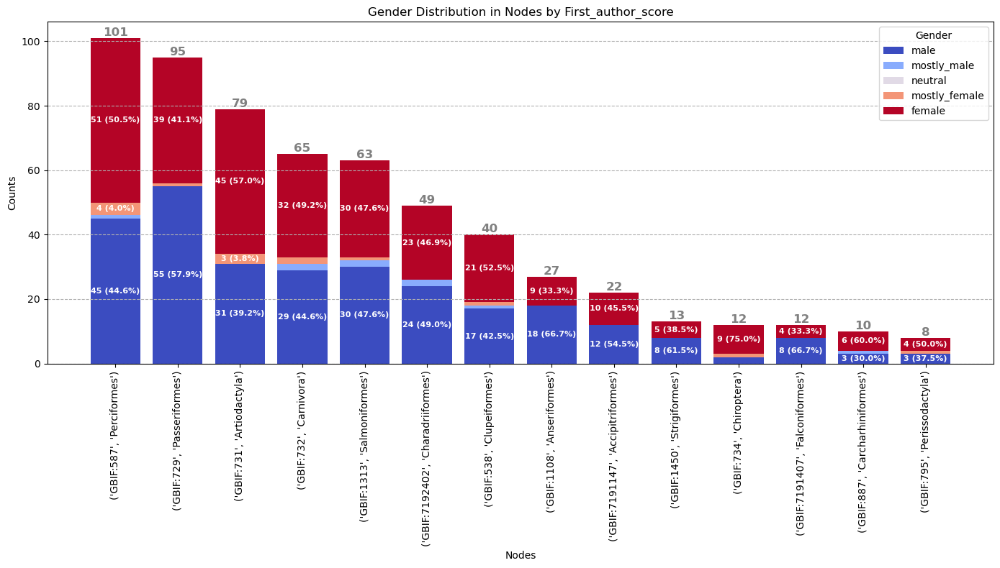

Gender Dist: {'mostly_female': 14, 'female': 295, 'unknown': 78, 'male': 565, 'mostly_male': 17, 'andy': 10}
Gender Data: {'male': [314, 40, 113, 53, 51, 183, 222, 346, 355, 85, 33, 482, 30, 565], 'mostly_male': [6, 2, 3, 1, 3, 8, 8, 15, 13, 3, 1, 13, 0, 17], 'neutral': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'mostly_female': [6, 2, 3, 1, 0, 6, 3, 9, 8, 4, 1, 9, 1, 14], 'female': [168, 21, 68, 20, 24, 88, 118, 171, 182, 48, 24, 248, 18, 295]}


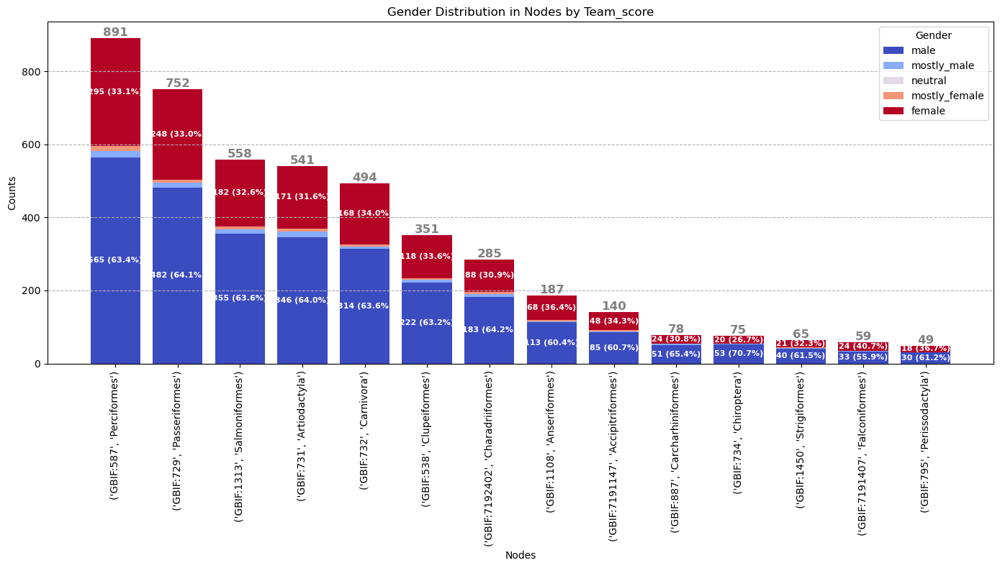

Gender Dist: {'male': 70, 'neutral': 6, 'female': 21, 'mostly_male': 2, 'mostly_female': 2}
Gender Data: {'male': [40, 10, 19, 7, 8, 39, 30, 56, 41, 19, 8, 67, 6, 70], 'mostly_male': [2, 1, 2, 0, 0, 2, 0, 1, 1, 0, 1, 0, 0, 2], 'neutral': [3, 0, 0, 3, 1, 3, 2, 9, 3, 0, 0, 6, 0, 6], 'mostly_female': [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 2], 'female': [20, 2, 5, 2, 1, 5, 8, 13, 18, 3, 3, 21, 2, 21]}


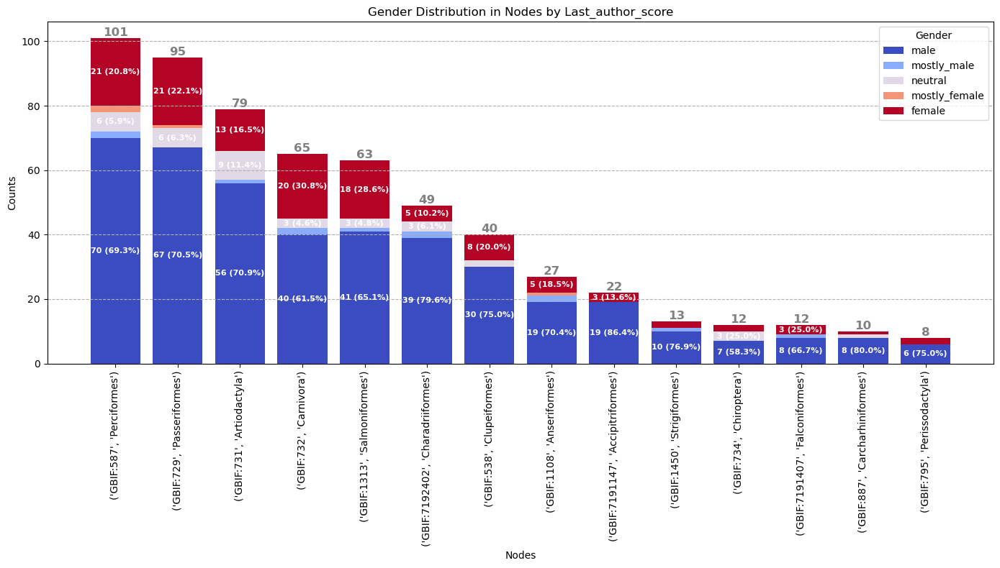

In [172]:

carnivore_aves = ['accipitriformes', 'charadriiformes', 'Strigiformes' , 'Falconiformes']
herbivore_aves = ['anseriformes', 'passeriformes']

carnivore_fish = ['Carcharhiniformes']
bony_fish= ['Salmoniformes', 'Perciformes', 'Cyproniformes' , 'Clupeiformes'] #Orders

carnivore_mammalia = ['Carnivora', 'Chiroptera']  # Many bats are insectivores, which falls under carnivory
herbivore_mammalia = ['Perissodactyla', 'Artiodactyla']

['Artiodactyla', 'Rodentia', 'Primates']  # Primates include both herbivores and omnivores, but many are primarily herbivorous

insects=['Coleoptera', 'Diptera', 'Hemiptera', 'Hymenopetr', 'Lepidoptera']

pretty= ['Hymenopetra', 'Lepidoptera', 'Sciuridae']

ugly=['Coleoptera', 'Diptera', 'Squamata', 'Chiroptera'] 


carnivores = carnivore_mammalia + carnivore_aves + carnivore_fish
herbivores = herbivore_mammalia + herbivore_aves + bony_fish


animals = set(
    carnivore_aves + herbivore_aves +
    carnivore_fish + bony_fish +
    carnivore_mammalia + herbivore_mammalia +
     insects +
    pretty + ugly
)



def plot_comparison_genders(graph, list_animals):

    # Create a list to store all the matching nodes
    all_matching_nodes = []

    # Find matching nodes for each name and add them to the list
    for name in list_animals:
        matching_nodes = find_node(graph, name)
        print(f"Nodes matching '{name}': {matching_nodes}")
        all_matching_nodes.extend(matching_nodes)

    subgraph = graph.subgraph(all_matching_nodes).copy()

    for score in gender_scores:
        plot_node_gender_distribution(subgraph, score)
        

plot_comparison_genders(order_G, herbivores + carnivores)

In [164]:
from collections import Counter

def normalize_dict_keys_values(data):
    """
    Normalize the keys and values in a dictionary or elements in a list:
    - Convert all keys to lowercase and replace spaces with underscores.
    - Convert all string values or list elements to lowercase and replace spaces with underscores.
    """
    if isinstance(data, dict):
        normalized_data = {}
        for key, value in data.items():
            normalized_key = key.lower().replace(' ', '_')
            if isinstance(value, dict) or isinstance(value, list):
                normalized_value = normalize_dict_keys_values(value)
            elif isinstance(value, str):
                normalized_value = value.lower().replace(' ', '_')
            else:
                normalized_value = value
            normalized_data[normalized_key] = normalized_value
        return normalized_data
    elif isinstance(data, list):
        return [normalize_dict_keys_values(item) if isinstance(item, (dict, list)) else item.lower().replace(' ', '_') if isinstance(item, str) else item for item in data]
    else:
        return data

def plot_comparison_genders(graph, list_animals):

    # Create a list to store all the matching nodes
    all_matching_nodes = []

    # Find matching nodes for each name and add them to the list
    for name in list_animals:
        matching_nodes = find_node(graph, name)
        print(f"Nodes matching '{name}': {matching_nodes}")
        all_matching_nodes.extend(matching_nodes)

    subgraph = graph.subgraph(all_matching_nodes).copy()

    # Example Gender Distribution Counter
    gender_dist = Counter({'Female': 51, 'Male': 45, 'Mostly female': 4, 'Mostly male': 1})

    # Normalize the gender distribution keys
    normalized_gender_dist = normalize_dict_keys_values(gender_dist)

    # Initialize the Gender Data dictionary with zeroes
    gender_labels = ['male', 'female', 'unknown', 'mostly_male', 'mostly_female']
    gender_data = {label: [0] * len(list_animals) for label in gender_labels}

    # Populate the Gender Data dictionary with the normalized counts
    for label in gender_labels:
        if label in normalized_gender_dist:
            gender_data[label][0] = normalized_gender_dist[label]

    print(f"Gender Data: {gender_data}")

    # Continue with the rest of your plotting function
    # Example:
    # plot_node_gender_distribution(subgraph, gender_data)

# Example usage
plot_comparison_genders(order_G, herbivores + carnivores)


Nodes matching 'Perissodactyla': [('GBIF:795', 'Perissodactyla')]
Nodes matching 'Artiodactyla': [('GBIF:731', 'Artiodactyla')]
Nodes matching 'anseriformes': [('GBIF:1108', 'Anseriformes')]
Nodes matching 'passeriformes': [('GBIF:729', 'Passeriformes')]
Nodes matching 'Salmoniformes': [('GBIF:1313', 'Salmoniformes')]
Nodes matching 'Perciformes': [('GBIF:587', 'Perciformes')]
Nodes matching 'Cyproniformes': []
Nodes matching 'Clupeiformes': [('GBIF:538', 'Clupeiformes')]
Nodes matching 'Carnivora': [('GBIF:732', 'Carnivora')]
Nodes matching 'Chiroptera': [('GBIF:734', 'Chiroptera')]
Nodes matching 'accipitriformes': [('GBIF:7191147', 'Accipitriformes')]
Nodes matching 'charadriiformes': [('GBIF:7192402', 'Charadriiformes')]
Nodes matching 'Strigiformes': [('GBIF:1450', 'Strigiformes')]
Nodes matching 'Falconiformes': [('GBIF:7191407', 'Falconiformes')]
Nodes matching 'Carcharhiniformes': [('GBIF:887', 'Carcharhiniformes')]
Gender Data: {'male': [45, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [12]:
# Create a subgraph with the specified nodes
subgraph_order = order_G.subgraph(matching_nodes_list).copy()
subgraph_order

# Merge Data

In [44]:
def extract_attributes_to_dataframe(graph, nodes):
    """
    Extract all attributes of a list of nodes and return them in a pandas DataFrame.

    Parameters:
    - graph: A NetworkX graph.
    - nodes: A list of nodes from which to extract attributes.

    Returns:
    - A pandas DataFrame with node names as the index and attribute names as columns.
    """
    # Initialize a list to store data
    data = []

    # Iterate through each node in the list
    for node in nodes:
        if node in graph.nodes:
            # Extract attributes of the node and add the node name to the data
            node_attrs = graph.nodes[node]
            node_attrs['node'] = node  # Add the node name as an attribute
            data.append(node_attrs)
        else:
            print(f"Warning: Node {node} is not in the graph.")

    # Convert the list of dictionaries to a pandas DataFrame
    df = pd.DataFrame(data)
    
    # Set the node names as the index
    df.set_index('node', inplace=True)
    
    return df




Nodes matching 'Carnivora': [('GBIF:732', 'Carnivora')]
Nodes matching 'Chiroptera': [('GBIF:734', 'Chiroptera')]


In [45]:
df.columns

Index(['size', 'total_count', 'color', 'border_color', 'first_author_score',
       'team_score', 'last_author_score', 'total_mentions', 'documents',
       'document_count', 'year_occurrences', 'gender_counts', 'FA_genders',
       'LA_genders', 'degree_centrality', 'betweenness_centrality',
       'closeness_centrality', 'eigenvector_centrality',
       'clustering_coefficient', 'strength', 'avg_weight_end_point_degree',
       'neighborhood_connectivity', 'male_neighbors', 'female_neighbors',
       'neutral_neighbors', 'node_name'],
      dtype='object')

In [76]:
from functools import reduce

def map_reduce_gender_counts(node_df,  gender_dict):
    """
    Perform a map-reduce operation on the 'gender_counts' column of the DataFrame.
    Aggregates the 'gender_counts' dictionaries across all rows and returns a single dictionary.

    Parameters:
    - node_df: A pandas DataFrame with a 'gender_counts' column containing dictionaries.

    Returns:
    - A dictionary with aggregated gender counts.
    """
    # Extract the 'gender_counts' column
    gender_counts_series = node_df[gender_dict]
    
    # Use map-reduce to aggregate the counts
    aggregated_counts = reduce(lambda x, y: dict(Counter(x) + Counter(y)), gender_counts_series)
    
    return aggregated_counts

aggregated_gender_counts = map_reduce_gender_counts(df, 'gender_counts')
aggregated_gender_counts

{'female': 188,
 'male': 367,
 'unknown': 34,
 'mostly_female': 7,
 'mostly_male': 7,
 'andy': 2}

In [133]:
def get_grouped_genders(names):
    # Create a list to store all the matching nodes
    all_matching_nodes = []

        # Find matching nodes for each name and add them to the list
    for name in names:
        matching_nodes = find_node(order_G, name)
        print(f"Nodes matching '{name}': {matching_nodes}")
        
        all_matching_nodes.extend(matching_nodes)

    df = extract_attributes_to_dataframe(order_G, all_matching_nodes)
    
    aggregated_gender_counts_fa = map_reduce_gender_counts(df, 'FA_genders')
    aggregated_gender_counts_team = map_reduce_gender_counts(df, 'gender_counts')
    aggregated_gender_counts_la = map_reduce_gender_counts(df, 'LA_genders')
    
    aggregated_gender_counts = {'first_author':aggregated_gender_counts_fa, 'team': aggregated_gender_counts_team, 'last_author':aggregated_gender_counts_la}
    
    return aggregated_gender_counts

#Carnivores
carnivore_mammalia_genders = get_grouped_genders(carnivore_mammalia)
carnivore_aves_genders = get_grouped_genders(carnivore_aves)
sharks_genders = get_grouped_genders(carnivore_fish)

#Herbivores
herbivore_mammalia_genders = get_grouped_genders(herbivore_mammalia)
herbivore_aves_genders = get_grouped_genders(herbivore_aves)
bony_fish_genders = get_grouped_genders(bony_fish)

#Insects
insects_genders = get_grouped_genders(insects)



Nodes matching 'Carnivora': [('GBIF:732', 'Carnivora')]
Nodes matching 'Chiroptera': [('GBIF:734', 'Chiroptera')]
Nodes matching 'accipitriformes': [('GBIF:7191147', 'Accipitriformes')]
Nodes matching 'charadriiformes': [('GBIF:7192402', 'Charadriiformes')]
Nodes matching 'Strigiformes': [('GBIF:1450', 'Strigiformes')]
Nodes matching 'Falconiformes': [('GBIF:7191407', 'Falconiformes')]
Nodes matching 'Carcharhiniformes': [('GBIF:887', 'Carcharhiniformes')]
Nodes matching 'Perissodactyla': [('GBIF:795', 'Perissodactyla')]
Nodes matching 'Artiodactyla': [('GBIF:731', 'Artiodactyla')]
Nodes matching 'anseriformes': [('GBIF:1108', 'Anseriformes')]
Nodes matching 'passeriformes': [('GBIF:729', 'Passeriformes')]
Nodes matching 'Salmoniformes': [('GBIF:1313', 'Salmoniformes')]
Nodes matching 'Perciformes': [('GBIF:587', 'Perciformes')]
Nodes matching 'Cyproniformes': []
Nodes matching 'Clupeiformes': [('GBIF:538', 'Clupeiformes')]
Nodes matching 'Coleoptera': [('GBIF:1470', 'Coleoptera')]
Nod

Nodes matching 'Sapindales': [('GBIF:933', 'Sapindales')]
Nodes matching 'Arecales': [('GBIF:552', 'Arecales')]
Nodes matching 'Pinales': [('GBIF:640', 'Pinales')]
Nodes matching 'Fagales': [('GBIF:1354', 'Fagales')]
Nodes matching 'Malpighiales': [('GBIF:1414', 'Malpighiales')]
Nodes matching 'Myrtales': [('GBIF:690', 'Myrtales')]
Nodes matching 'Acorales': [('GBIF:7227341', 'Acorales')]
Nodes matching 'Alismatales': [('GBIF:551', 'Alismatales')]
Nodes matching 'Apiales': [('GBIF:1351', 'Apiales')]
Nodes matching 'Aquifoliales': []
Nodes matching 'Asparagales': [('GBIF:1169', 'Asparagales')]
Nodes matching 'Asterales': [('GBIF:414', 'Asterales')]
Nodes matching 'Berberidopsidales': []
Nodes matching 'Boraginales': [('GBIF:7226464', 'Boraginales')]
Nodes matching 'Brassicales': [('GBIF:7225535', 'Brassicales')]
Nodes matching 'Caryophyllales': [('GBIF:422', 'Caryophyllales')]
Nodes matching 'Celastrales': []
Nodes matching 'Ceratophyllales': []
Nodes matching 'Commelinales': []
Nodes m

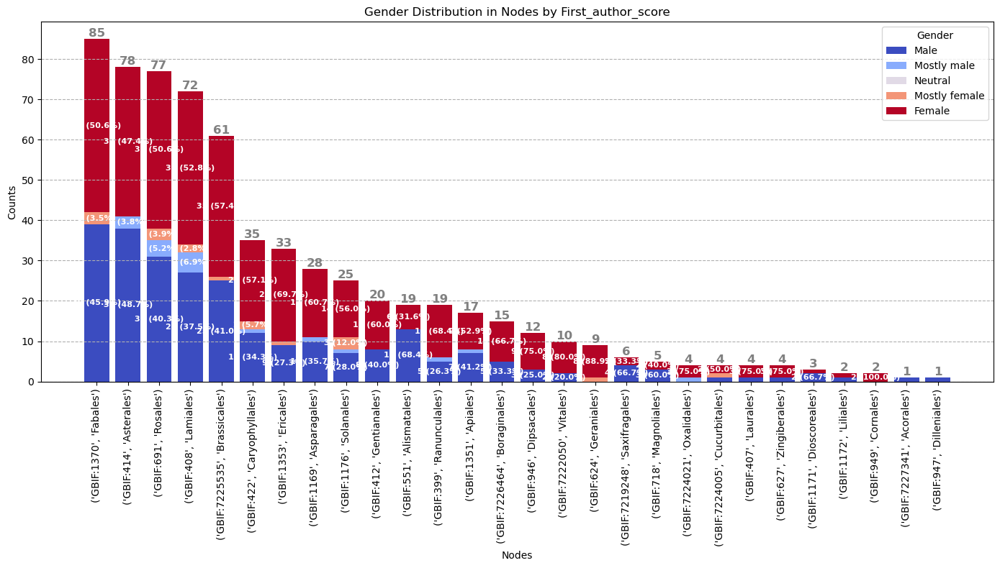

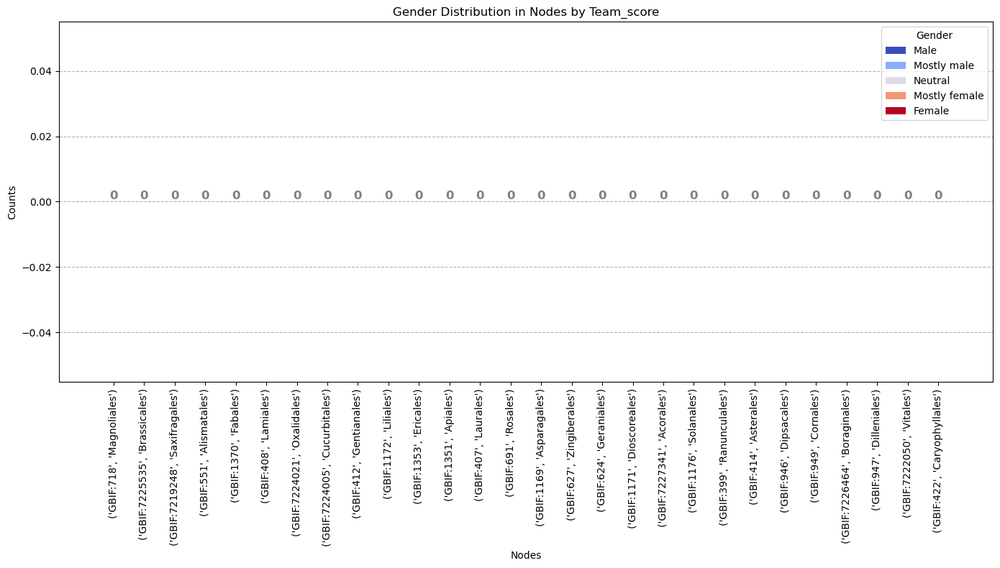

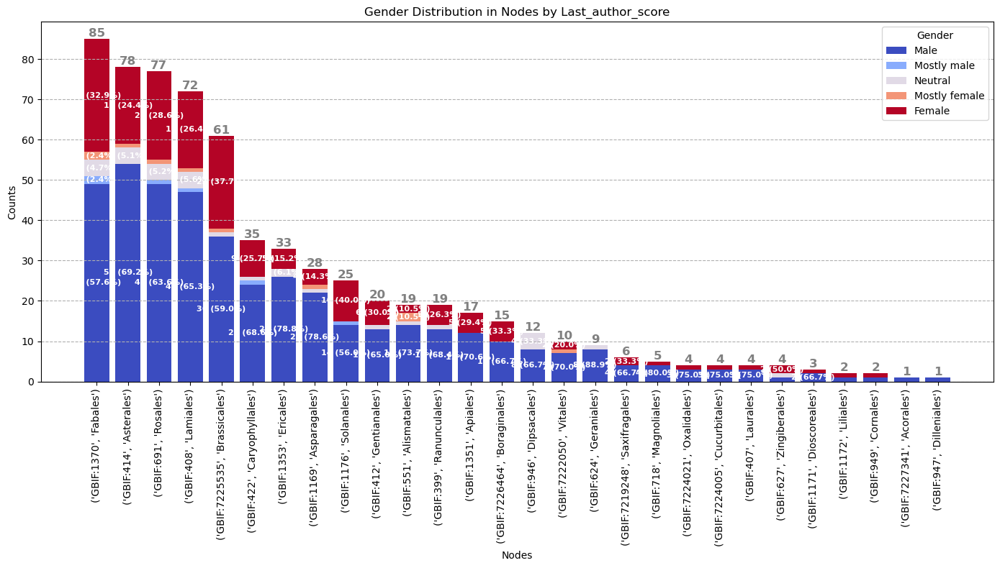

In [154]:
#pretty= ['Hymenopetra', 'Lepidoptera', 'Sciuridae'] #No hay Hymenopetra ni Sciurida
#ugly=['Coleoptera', 'Diptera', 'Squamata', 'Chiroptera'] # no hay Squamata

trees = [
    "Sapindales", "Arecales", "Pinales", "Fagales", "Malpighiales", "Myrtales"
]

trees_genders = get_grouped_genders(trees)


flowers = [
    "Acorales",
    "Alismatales",
    "Apiales",
    #"Aquifoliales",
    "Asparagales",
    "Asterales",
    "Berberidopsidales",
    "Boraginales",
    "Brassicales",
    "Caryophyllales",
    #"Celastrales",
    #"Ceratophyllales",
    #"Commelinales",
    "Cornales",
    #"Crossosomatales",
    "Cucurbitales",
    "Dilleniales",
    "Dioscoreales",
    "Dipsacales",
    "Ericales",
    #"Escalloniales",
    "Fabales",
    #"Garryales",
    "Gentianales",
    "Geraniales",
    "Lamiales",
    "Laurales",
    "Liliales",
    "Magnoliales",
    #"Nymphaeales",
    "Oxalidales",
    #"Pandanales",
    #"Piperales",
    #"Proteales",
    "Ranunculales",
    "Rosales",
    #"Santalales",
    "Saxifragales",
    "Solanales",
    "Vitales",
    "Zingiberales",
    #"Zygophyllales"
]
flowers_genders = get_grouped_genders(flowers)

#plot_comparison_genders(order_G, flowers )

In [143]:
def get_order_genders(name):
    
    matching_nodes = find_node(order_G, name)
    print(f"Nodes matching '{name}': {matching_nodes}")
        
    df = extract_attributes_to_dataframe(order_G, matching_nodes)
    
    aggregated_gender_counts_fa = map_reduce_gender_counts(df, 'FA_genders')
    aggregated_gender_counts_team = map_reduce_gender_counts(df, 'gender_counts')
    aggregated_gender_counts_la = map_reduce_gender_counts(df, 'LA_genders')
    
    aggregated_gender_counts = {'first_author':aggregated_gender_counts_fa, 'team': aggregated_gender_counts_team, 'last_author':aggregated_gender_counts_la}
    
    return aggregated_gender_counts

#pretty #bees and wasps
pretty_genders = {'butterflies_mot' :get_order_genders('Chiroptera') }
#ugly
ugly_genders = get_grouped_genders(ugly)
pretty_genders

Nodes matching 'Chiroptera': [('GBIF:734', 'Chiroptera')]
Nodes matching 'Coleoptera': [('GBIF:1470', 'Coleoptera')]
Nodes matching 'Diptera': [('GBIF:811', 'Diptera')]
Nodes matching 'Squamata': []
Nodes matching 'Chiroptera': [('GBIF:734', 'Chiroptera')]


{'butterflies_mot': {'first_author': Counter({'Female': 9,
           'Male': 2,
           'Mostly female': 1}),
  'team': {'female': 20,
   'unknown': 2,
   'male': 53,
   'andy': 1,
   'mostly_male': 1,
   'mostly_female': 1},
  'last_author': Counter({'Female': 2, 'Male': 7, 'Neutral': 3})}}

In [146]:
aggregated_carnivors_raw = {'Carnivore Mammals':carnivore_mammalia_genders, 'Birds of Prey':carnivore_aves_genders,  'Sharks':sharks_genders}
aggregated_herbivors_raw = {'herbivore Mammals':herbivore_mammalia_genders, 'Other Birds':herbivore_aves_genders,  'bony fish':bony_fish_genders}

aggregated_flora_raw = {'floral' : flowers_genders, 'trees' : trees_genders}

# Normalization function to adjust the dictionary keys and values
def normalize_dict_keys_values(data):
    normalized_data = {}
    for group, gender_dicts in data.items():
        # Normalize the group name
        normalized_group = group.lower().replace(' ', '_')
        
        # Normalize the internal keys and values
        normalized_gender_dicts = {}
        for gender_key, counts in gender_dicts.items():
            normalized_gender_key = gender_key.lower().replace(' ', '_')
            normalized_counts = {k.lower().replace(' ', '_'): v for k, v in counts.items()}
            normalized_gender_dicts[normalized_gender_key] = normalized_counts
        
        normalized_data[normalized_group] = normalized_gender_dicts
    
    return normalized_data

# Normalize aggregated_carnivores
aggregated_carnivors = normalize_dict_keys_values(aggregated_carnivors_raw)
aggregated_herbivors = normalize_dict_keys_values(aggregated_herbivors_raw)

aggregated_flora = normalize_dict_keys_values(aggregated_flora_raw)

aggregated_flora


{'floral': {'first_author': {'male': 256,
   'female': 360,
   'mostly_male': 18,
   'mostly_female': 17},
  'team': {'male': 2832,
   'female': 1540,
   'unknown': 339,
   'andy': 28,
   'mostly_male': 95,
   'mostly_female': 80},
  'last_author': {'male': 430,
   'neutral': 30,
   'female': 175,
   'mostly_female': 10,
   'mostly_male': 6}},
 'trees': {'first_author': {'male': 133,
   'female': 148,
   'mostly_male': 9,
   'mostly_female': 4},
  'team': {'male': 1441,
   'female': 871,
   'unknown': 193,
   'mostly_female': 36,
   'mostly_male': 46,
   'andy': 16},
  'last_author': {'male': 188,
   'female': 81,
   'neutral': 18,
   'mostly_female': 7}}}

In [130]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec

# Color mapping
colors_label = {
    'male': '#3B4CC0',
    'mostly_male': '#89ACFD',
    'unknown': '#E1DAE6', 
    'mostly_female':'#F39577',
    'female': '#B40426'
}

def plot_group_distribution_multiple_dict(aggregated_gender_counts_dict, title_complement):
    """
    Plots three figures with a pie chart on the left showing overall gender distribution and a stacked bar chart on the right
    showing the gender distribution for First Author (fa), Team (team), and Last Author (last_author) across different groups.

    Parameters:
    - aggregated_gender_counts_dict: A dictionary where each key is a group name, and each value is a dictionary containing
      'first_author', 'team', and 'last_author' gender counts.
    """
    
    for key in ['first_author', 'team', 'last_author']:
        gender_data = {label: [] for label in colors_label.keys()}
        group_names = list(aggregated_gender_counts_dict.keys())
        
        # Collect data for the bar chart
        for group_name in group_names:
            gender_counts = aggregated_gender_counts_dict[group_name][key]
            for label in colors_label.keys():
                gender_data[label].append(gender_counts.get(label, 0))  # Use label directly without capitalize
        
        print(f'Gender data: {gender_data}')

        # Calculate total counts for each group
        total_counts = [sum(gender_data[label][i] for label in colors_label.keys()) for i in range(len(group_names))]
        max_total_count = max(total_counts)
        
        # Prepare data for pie chart
        overall_gender_counts = {label: sum(gender_data[label]) for label in colors_label.keys()}
        print(overall_gender_counts)
        pie_labels = [f"{label.capitalize()} ({count})" for label, count in overall_gender_counts.items() if count > 0]
        pie_sizes = [count for count in overall_gender_counts.values() if count > 0]
        pie_colors = [colors_label[label] for label, count in overall_gender_counts.items() if count > 0]

        # Only proceed if we have valid pie data
        if pie_sizes:
            # Plotting setup with GridSpec
            fig = plt.figure(figsize=(16, 8))
            gs = GridSpec(1, 2, width_ratios=[1, 2])

            # Plot the pie chart
            ax_pie = fig.add_subplot(gs[0])
            wedges, texts, autotexts = ax_pie.pie(pie_sizes, labels=pie_labels, colors=pie_colors, autopct='%1.1f%%', startangle=140)
            for autotext in autotexts:
                autotext.set_color('white')
                autotext.set_fontsize(10)
            ax_pie.set_title(f'Overall Gender Distribution ({key.capitalize()})')
        else:
            # If no valid pie data, skip the pie chart
            fig, ax_bar = plt.subplots(figsize=(12, 8))

        # Plot the bar chart
        if pie_sizes:
            ax_bar = fig.add_subplot(gs[1])
        else:
            ax_bar = fig.add_subplot(111)

        bottom = np.zeros(len(group_names))

        for label in colors_label.keys():
            values = gender_data[label]
            bars = ax_bar.bar(group_names, values, bottom=bottom, color=colors_label[label], label=label)

            for idx, (bar, count) in enumerate(zip(bars, values)):
                if count > 0 and count >= 0.02 * max_total_count:  # Label only if count is more than 2% of the highest bar
                    percentage = (count / total_counts[idx]) * 100 if total_counts[idx] > 0 else 0
                    ax_bar.text(
                        bar.get_x() + bar.get_width() / 2,
                        bar.get_y() + bar.get_height() / 2,
                        f"{count} ({percentage:.1f}%)",
                        ha='center',
                        va='center',
                        color='white',
                        fontsize=8,
                        fontweight='bold'
                    )

            bottom += np.array(values)

        # Add the total count above each bar
        for idx, group in enumerate(group_names):
            ax_bar.text(
                idx,
                total_counts[idx],
                str(int(total_counts[idx])),
                ha='center',
                va='bottom',
                color='grey',
                fontsize=12,
                fontweight='bold'
            )

        # Adding labels and title
        ax_bar.set_xlabel('Groups')
        ax_bar.set_ylabel('Counts')
        ax_bar.set_title(f'Gender Distribution Across {title_complement} ({key.capitalize()})')
        ax_bar.legend(title='Gender')
        plt.xticks(rotation=45)
        
        # Set the y-axis limit with extra margin
        y_max = max_total_count * 1.1
        ax_bar.set_ylim(0, y_max)

        # Adding grid and layout adjustment
        ax_bar.grid(axis='y', linestyle='--')
        plt.tight_layout()
        plt.savefig(f'C:/Users/maria/OneDrive/Documentos/Thesis/Report/{title_complement}_{key}_distribution.png')

        # Display the plot
        plt.show()




Gender data: {'male': [31, 52, 3], 'mostly_male': [2, 2, 1], 'unknown': [0, 0, 0], 'mostly_female': [3, 0, 0], 'female': [41, 42, 6]}
{'male': 86, 'mostly_male': 5, 'unknown': 0, 'mostly_female': 3, 'female': 89}


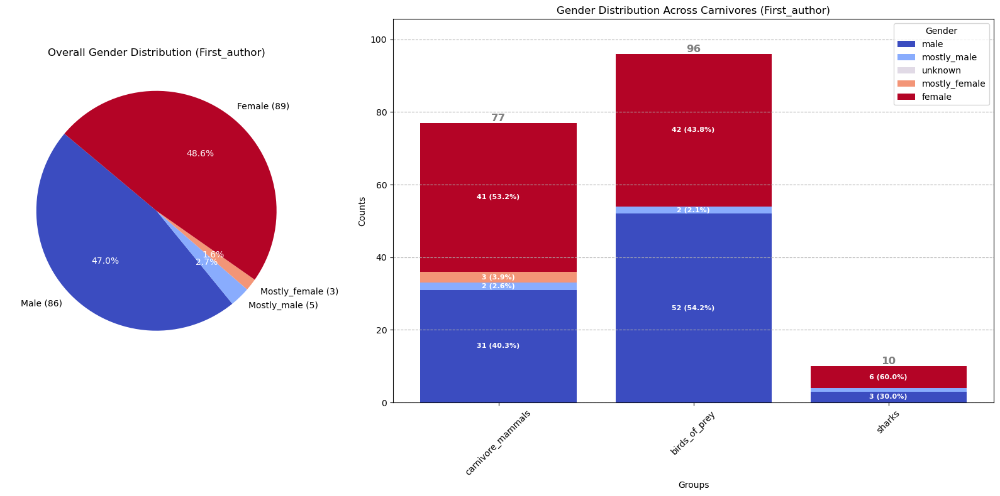

Gender data: {'male': [367, 341, 51], 'mostly_male': [7, 14, 3], 'unknown': [34, 44, 8], 'mostly_female': [7, 13, 0], 'female': [188, 181, 24]}
{'male': 759, 'mostly_male': 24, 'unknown': 86, 'mostly_female': 20, 'female': 393}


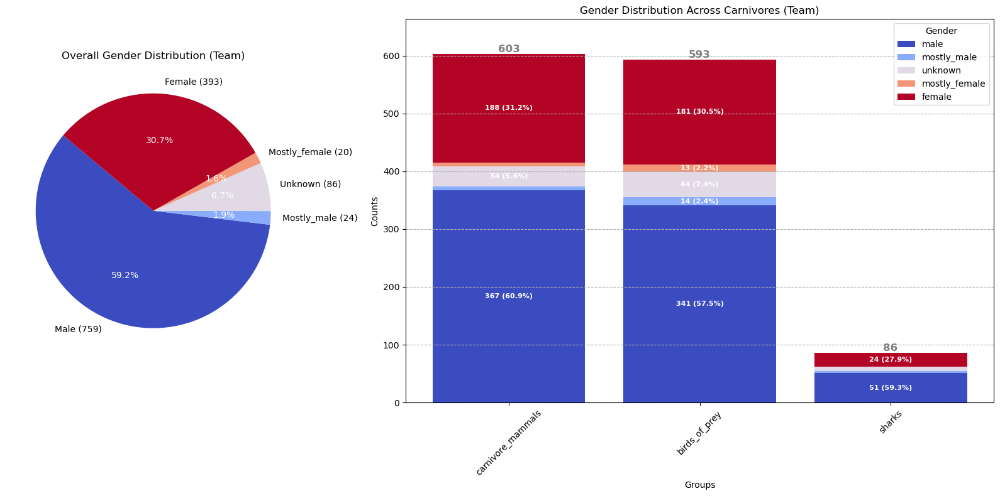

Gender data: {'male': [47, 76, 8], 'mostly_male': [2, 4, 0], 'unknown': [0, 0, 0], 'mostly_female': [0, 0, 0], 'female': [22, 13, 1]}
{'male': 131, 'mostly_male': 6, 'unknown': 0, 'mostly_female': 0, 'female': 36}


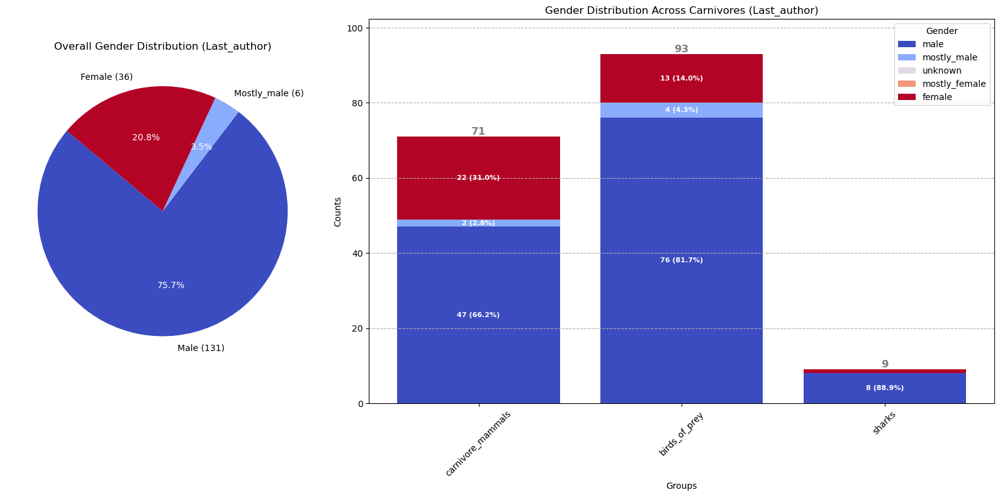

In [131]:
# Example usage:
plot_group_distribution_multiple_dict(aggregated_carnivors, "Carnivores")

Gender data: {'male': [34, 73, 92], 'mostly_male': [0, 0, 4], 'unknown': [0, 0, 0], 'mostly_female': [4, 1, 6], 'female': [49, 48, 102]}
{'male': 199, 'mostly_male': 4, 'unknown': 0, 'mostly_female': 11, 'female': 199}


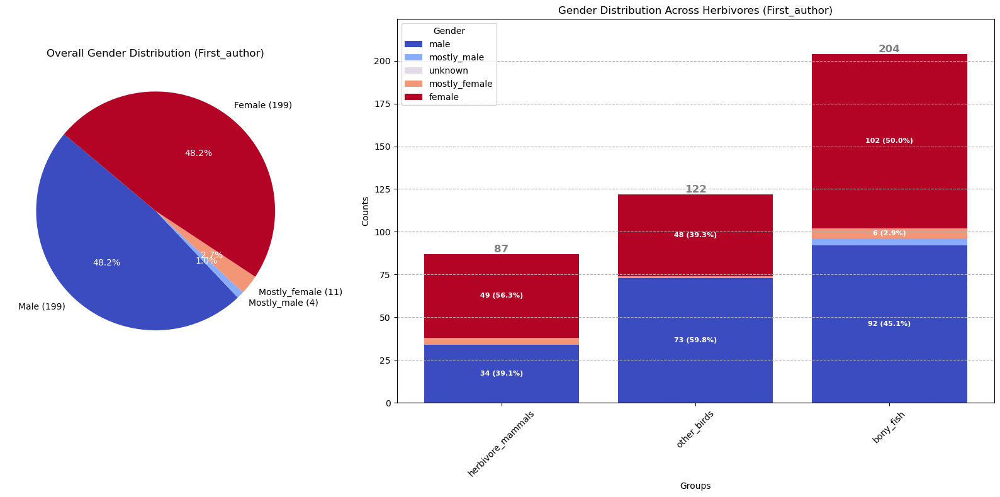

Gender data: {'male': [376, 595, 1142], 'mostly_male': [15, 16, 38], 'unknown': [37, 46, 134], 'mostly_female': [10, 12, 25], 'female': [189, 316, 595]}
{'male': 2113, 'mostly_male': 69, 'unknown': 217, 'mostly_female': 47, 'female': 1100}


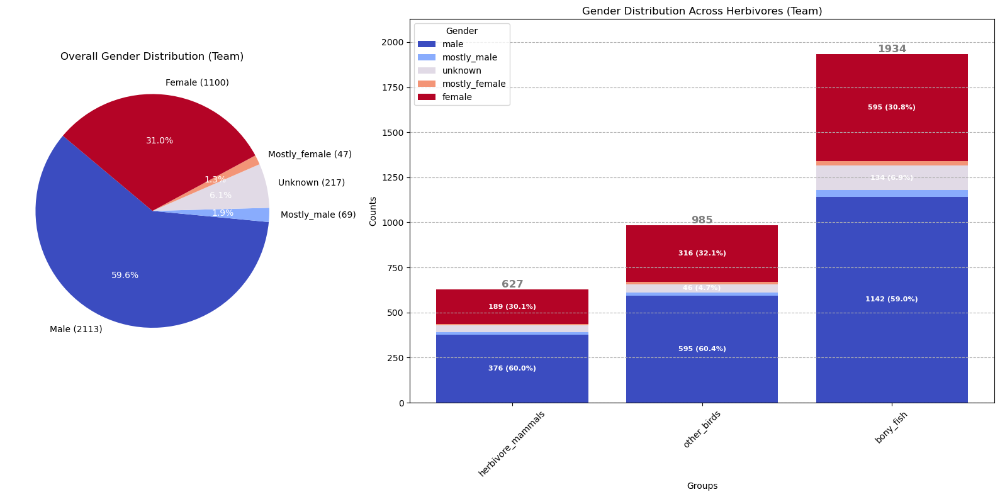

Gender data: {'male': [62, 86, 141], 'mostly_male': [1, 2, 3], 'unknown': [0, 0, 0], 'mostly_female': [0, 2, 2], 'female': [15, 26, 47]}
{'male': 289, 'mostly_male': 6, 'unknown': 0, 'mostly_female': 4, 'female': 88}


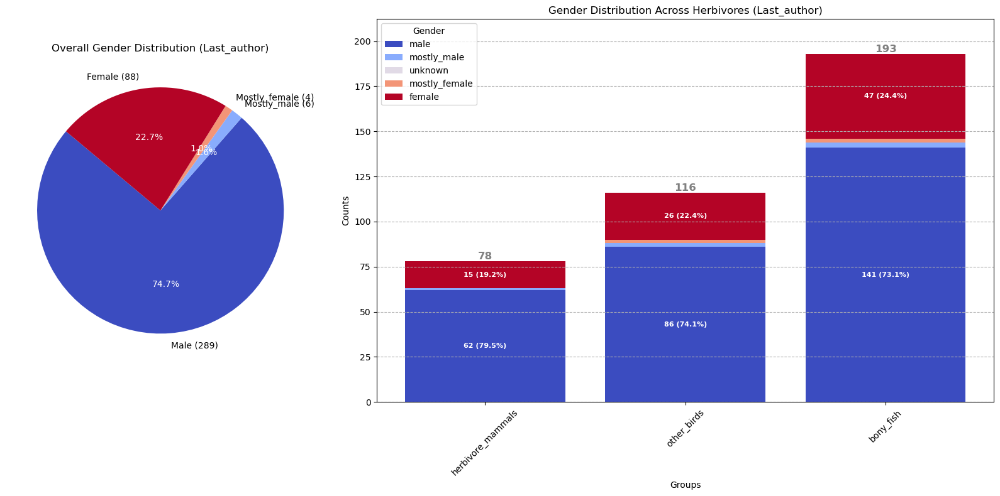

In [132]:
# Example usage:
plot_group_distribution_multiple_dict(aggregated_herbivors, "Herbivores")

Gender data: {'male': [256, 133], 'mostly_male': [18, 9], 'unknown': [0, 0], 'mostly_female': [17, 4], 'female': [360, 148]}
{'male': 389, 'mostly_male': 27, 'unknown': 0, 'mostly_female': 21, 'female': 508}


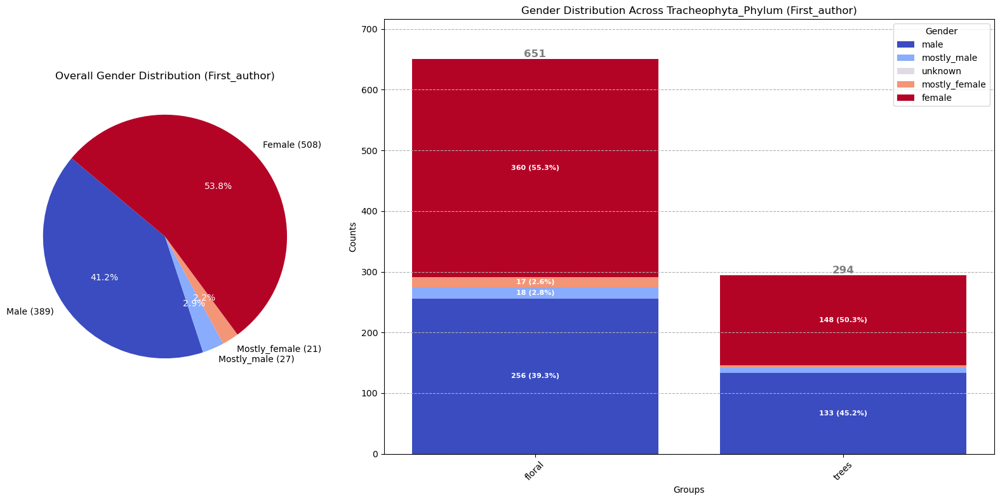

Gender data: {'male': [2832, 1441], 'mostly_male': [95, 46], 'unknown': [339, 193], 'mostly_female': [80, 36], 'female': [1540, 871]}
{'male': 4273, 'mostly_male': 141, 'unknown': 532, 'mostly_female': 116, 'female': 2411}


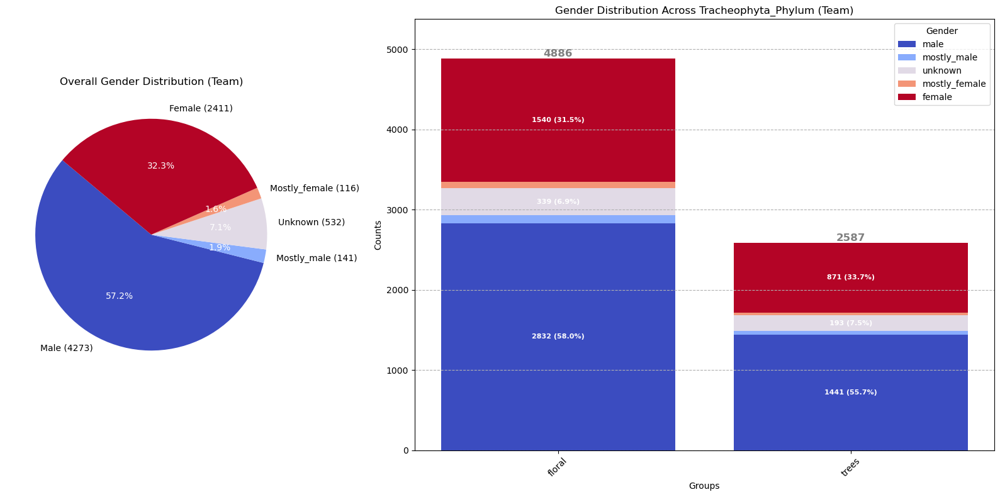

Gender data: {'male': [430, 188], 'mostly_male': [6, 0], 'unknown': [0, 0], 'mostly_female': [10, 7], 'female': [175, 81]}
{'male': 618, 'mostly_male': 6, 'unknown': 0, 'mostly_female': 17, 'female': 256}


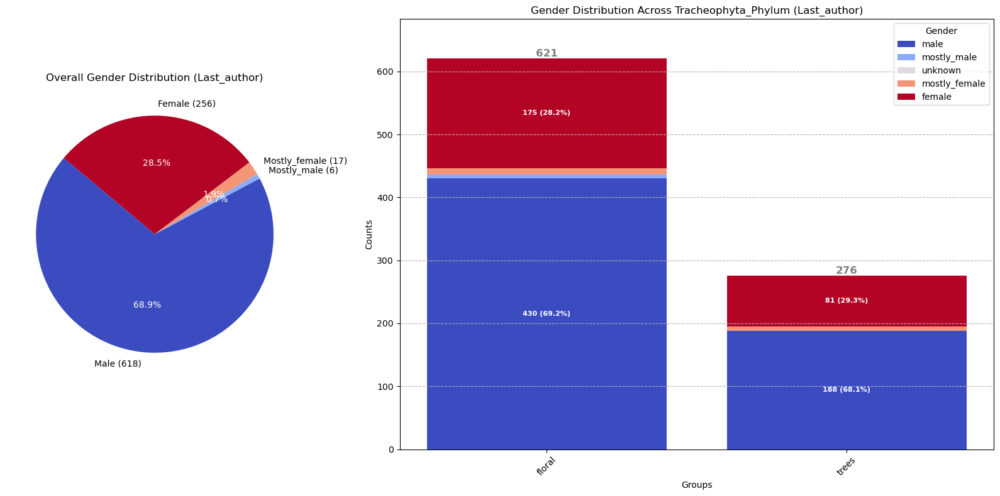

In [148]:

plot_group_distribution_multiple_dict(aggregated_flora, "Tracheophyta_Phylum")